## Part B: Land Cover Modeling


Simple deployment can be found here: https://huggingface.co/spaces/amosfang/Deep_Globe_Land_Cover_Classification_2018

### Summary of Work

In Part A, data preprocessing is performed on the original land cover dataset (2448 by 2448 RGB) satellite images with its corresponding (2448 by 2448 RGB) segmentation mask. These images are being resized to 256 by 256 RGB to accomodate to the deep learning task.

In Part B, a 4 stage U-net model is trained, from scratch without pretrained weights, for 92 epochs and achieved a validation accuracy of 74\%. It was highlighted that there was class imbalance in the dataset (about 56\% of the pixels are labelled agriculture), so a poor model could have labelled all image pixels agriculture and attained an accuracy of at least 56\%.

Originally, there is 70/15/15 split of the images into train/validation/test. However, as the validation and test datasets do not have segmentation mask, I have used 803 images from train dataset and split it 80/20 (train/validation) for the network training.

### Next Steps

In subsequent sprints, I outline the plan:

* Develop the computation for mean IoU using the sample GT labels and predicted labels
* Apply transfer learning to get improved accuracy and IoU (VGG and ResNet)
* Explore other light-weight models like MobileNet for deployment

---

### Notes

Below are the class labels:
The RGB values have been normalized from 0-255 to 0-1.

```
# RGB to Class Mapping
rgb_to_class = {
    (0, 1, 1): 1,  # urban_land
    (1, 1, 0): 2,  # agriculture_land
    (1, 0, 1): 3,  # rangeland
    (0, 1, 0): 4,  # forest_land
    (0, 0, 1): 5,  # water
    (1, 1, 1): 6,  # barren_land
    (0, 0, 0): 7  # unknown
} # one-indexing
```

### Mount Google Drive and load data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls /content/drive/MyDrive/ad-hoc_data/archive/

'train_2024-02-14 11-20-17'  'train_2024-02-25 02-32-21'   y_masks.npy
'train_2024-02-25 02-29-55'   x_images.npy


In [ ]:
npy_folder = '/content/drive/MyDrive/ad-hoc_data/archive'

In [ ]:
import numpy as np

X_npy = np.load(npy_folder + "/x_images.npy")
y_npy = np.load(npy_folder + "/y_masks.npy")

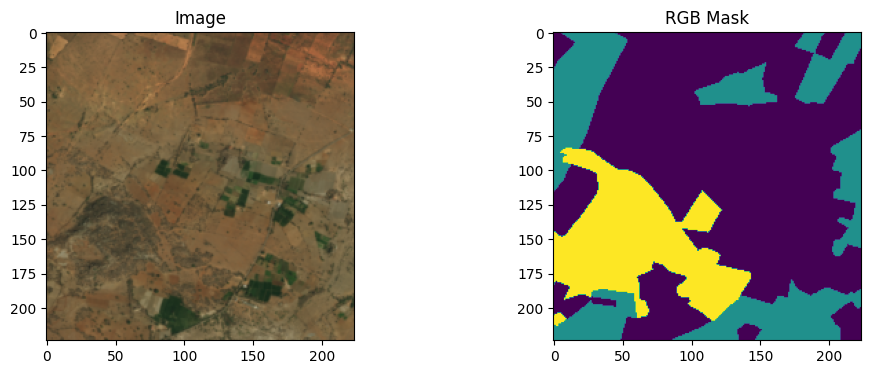

[[1. 1. 1. ... 2. 2. 2.]
 [1. 1. 1. ... 2. 2. 2.]
 [1. 1. 1. ... 2. 2. 2.]
 ...
 [2. 2. 2. ... 1. 1. 1.]
 [2. 2. 2. ... 1. 1. 1.]
 [2. 2. 2. ... 1. 1. 1.]]


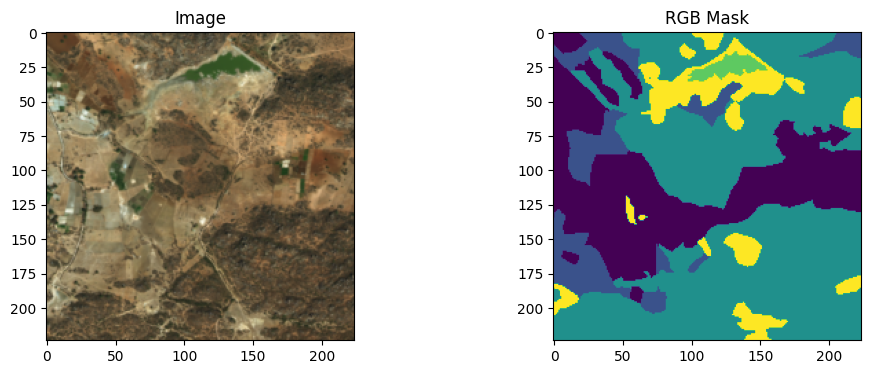

[[1. 1. 1. ... 2. 2. 2.]
 [1. 1. 1. ... 2. 2. 2.]
 [1. 1. 1. ... 2. 2. 2.]
 ...
 [3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]]


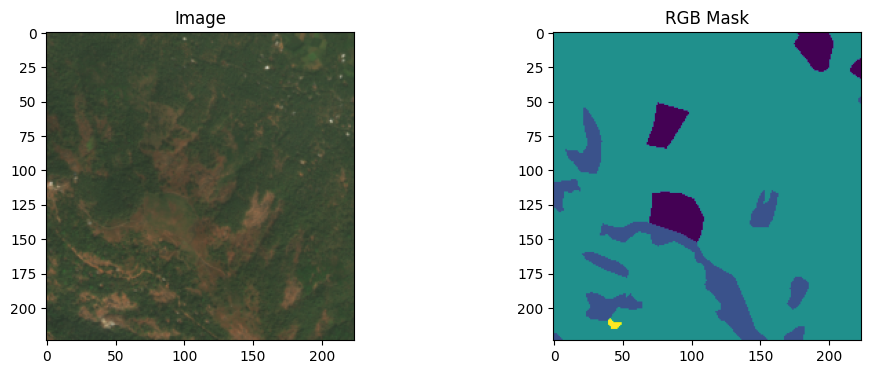

[[3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]
 [3. 3. 3. ... 3. 3. 3.]
 ...
 [2. 2. 2. ... 3. 3. 3.]
 [2. 2. 2. ... 3. 3. 3.]
 [2. 2. 2. ... 3. 3. 3.]]


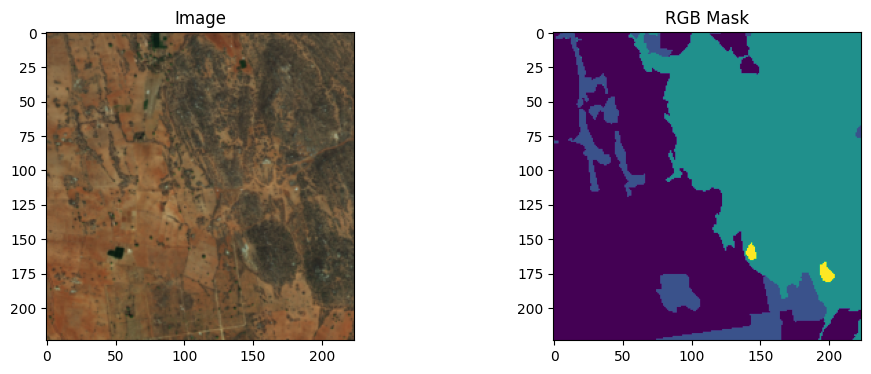

[[1. 1. 1. ... 3. 3. 3.]
 [1. 1. 1. ... 3. 3. 3.]
 [1. 1. 1. ... 3. 3. 3.]
 ...
 [1. 1. 1. ... 3. 3. 3.]
 [1. 1. 1. ... 3. 3. 3.]
 [1. 1. 1. ... 3. 3. 3.]]


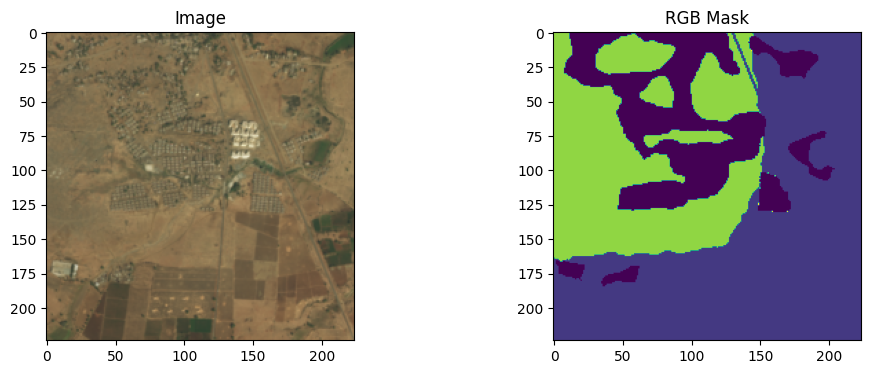

[[5. 5. 5. ... 1. 1. 1.]
 [5. 5. 5. ... 1. 1. 1.]
 [5. 5. 5. ... 1. 1. 1.]
 ...
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]
 [1. 1. 1. ... 1. 1. 1.]]


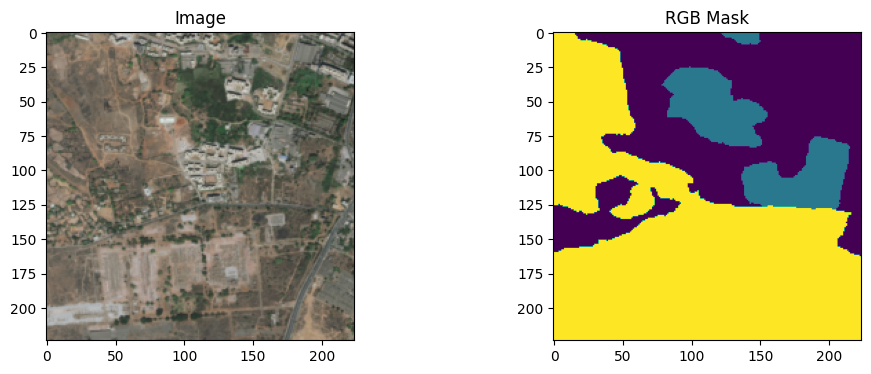

[[5. 5. 5. ... 0. 0. 0.]
 [5. 5. 5. ... 0. 0. 0.]
 [5. 5. 5. ... 0. 0. 0.]
 ...
 [5. 5. 5. ... 5. 5. 5.]
 [5. 5. 5. ... 5. 5. 5.]
 [5. 5. 5. ... 5. 5. 5.]]


In [ ]:
import matplotlib.pyplot as plt

images_list = [19, 181, 39, 258, 732, 454]

for image_idx in images_list:
    # Load the image and mask
    image = X_npy[image_idx].astype(np.float32)
    rgb_mask = y_npy[image_idx].astype(np.float32)

    # Example: Display the images
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Image')

    plt.subplot(1, 2, 2)
    plt.imshow(rgb_mask, cmap='viridis')


    plt.title('RGB Mask')

    plt.show()
    print(rgb_mask)


**Theory**

* From TU Delft Satellite imagery and U-net course: https://github.com/srimannarayanabaratam/land_cover_classification_unet

**Code**

* Tensorflow U-net code was obtained and then refactored **from**: https://github.com/mayrajeo/lulc_ml/tree/master/unet

In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, BatchNormalization, Activation, Conv2DTranspose, Dropout
from keras.models import Model


def build_unet(channels, num_classes):

    x = Input((None, None, channels), name='input_1')

    # Encoder
    enc11 = Conv2D(32, (3, 3), padding='same', name='encoder_stage0_conv1', use_bias=False)(x)
    enc11 = BatchNormalization(name='encoder_stage0_bn1')(enc11)
    enc11 = Activation('relu', name='encoder_stage0_relu1')(enc11)

    enc12 = Conv2D(32, (3, 3), padding='same', name='encoder_stage0_conv2', use_bias=False)(enc11)
    enc12 = BatchNormalization(name='encoder_stage0_bn2')(enc12)
    enc12 = Activation('relu', name='encoder_stage0_relu2')(enc12)

    enc1 = MaxPooling2D((2, 2), name='encoder_stage0_pool')(enc12)

    enc21 = Conv2D(64, (3, 3), padding='same', name='encoder_stage1_conv1', use_bias=False)(enc1)
    enc21 = BatchNormalization(name='encoder_stage1_bn1')(enc21)
    enc21 = Activation('relu', name='encoder_stage1_relu1')(enc21)

    enc22 = Conv2D(64, (3, 3), padding='same', name='encoder_stage1_conv2', use_bias=False)(enc21)
    enc22 = BatchNormalization(name='encoder_stage1_bn2')(enc22)
    enc22 = Activation('relu', name='encoder_stage1_relu2')(enc22)

    enc2 = MaxPooling2D((2, 2), name='encoder_stage1_pool')(enc22)

    enc31 = Conv2D(128, (3, 3), padding='same', name='encoder_stage2_conv1', use_bias=False)(enc2)
    enc31 = BatchNormalization(name='encoder_stage2_bn1')(enc31)
    enc31 = Activation('relu', name='encoder_stage2_relu1')(enc31)

    enc32 = Conv2D(128, (3, 3), padding='same', name='encoder_stage2_conv2', use_bias=False)(enc31)
    enc32 = BatchNormalization(name='encoder_stage2_bn2')(enc32)
    enc32 = Activation('relu', name='encoder_stage2_relu2')(enc32)

    enc3 = MaxPooling2D((2, 2), name='encoder_stage2_pool')(enc32)

    enc41 = Conv2D(256, (3, 3), padding='same', name='encoder_stage3_conv1', use_bias=False)(enc3)
    enc41 = BatchNormalization(name='encoder_stage3_bn1')(enc41)
    enc41 = Activation('relu', name='encoder_stage3_relu1')(enc41)

    enc42 = Conv2D(256, (3, 3), padding='same', name='encoder_stage3_conv2', use_bias=False)(enc41)
    enc42 = BatchNormalization(name='encoder_stage3_bn2')(enc42)
    enc42 = Activation('relu', name='encoder_stage3_relu2')(enc42)

    enc4 = MaxPooling2D((2, 2), name='encoder_stage3_pool')(enc42)

    # Skip connections
    skip1 = enc12
    skip2 = enc22
    skip3 = enc32
    skip4 = enc42

    # Decoder
    dec11 = Conv2DTranspose(512, kernel_size = (4, 4), strides = (2,2),
                            padding='same', name='decoder_stage0_up', use_bias=False)(enc4)
    dec11 = BatchNormalization(name='decoder_stage0_bn1')(dec11)
    dec11 = Activation('relu', name='decoder_stage0_relu1')(dec11)

    dec11 = Concatenate(name='concatenate_0')([dec11, skip4])

    dec12 = Conv2D(512, (3, 3), padding='same', name='decoder_stage0_conv2', use_bias=False)(dec11)
    dec12 = BatchNormalization(name='decoder_stage0_bn2')(dec12)
    dec12 = Activation('relu', name='decoder_stage0_relu2')(dec12)

    dec21 = Conv2DTranspose(256, kernel_size = (4, 4), strides = (2,2),
                            padding='same', name='decoder_stage1_up', use_bias=False)(dec12)
    dec21 = BatchNormalization(name='decoder_stage1_bn1')(dec21)
    dec21 = Activation('relu', name='decoder_stage1_relu1')(dec21)

    dec21 = Concatenate(name='concatenate_1')([dec21, skip3])

    dec22 = Conv2D(256, (3, 3), padding='same', name='decoder_stage1_conv2', use_bias=False)(dec21)
    dec22 = BatchNormalization(name='decoder_stage1_bn2')(dec22)
    dec22 = Activation('relu', name='decoder_stage1_relu2')(dec22)

    dec31 = Conv2DTranspose(128, kernel_size = (4, 4), strides = (2,2),
                            padding='same', name='decoder_stage2_up', use_bias=False)(dec22)
    dec31 = BatchNormalization(name='decoder_stage2_bn1')(dec31)
    dec31 = Activation('relu', name='decoder_stage2_relu1')(dec31)

    dec31 = Concatenate(name='concatenate_2')([dec31, skip2])

    dec32 = Conv2D(128, (3, 3), padding='same', name='decoder_stage2_conv2', use_bias=False)(dec31)
    dec32 = BatchNormalization(name='decoder_stage2_bn2')(dec32)
    dec32 = Activation('relu', name='decoder_stage2_relu2')(dec32)

    dec41 = Conv2DTranspose(64, kernel_size = (4, 4), strides = (2,2),
                            padding='same', name='decoder_stage3_up', use_bias=False)(dec32)
    dec41 = BatchNormalization(name='decoder_stage3_bn1')(dec41)
    dec41 = Activation('relu', name='decoder_stage3_relu1')(dec41)

    dec41 = Concatenate(name='concatenate_3')([dec41, skip1])

    dec42 = Conv2D(64, (3, 3), padding='same', name='decoder_stage3_conv1', use_bias=False)(dec41)
    dec42 = BatchNormalization(name='decoder_stage3_bn2')(dec42)
    dec42 = Activation('relu', name='decoder_stage3_relu2')(dec42)

    dec42 = Conv2D(num_classes, (3, 3), padding='same', name='final_conv')(dec42)
    dec42 = Activation(activation = 'softmax', name='output_softmax')(dec42)

    model = Model(inputs=x, outputs=dec42, name='model_1')

    return model

# 1 - Tensorflow Functional Model for initial training
# Define your input_shape and num_classes
channels = 3
num_classes = 7

# # Build the U-Net model
model = build_unet(channels, num_classes)

# 2 - Load checkpointed model for continuation of training or predict validation set
# from tensorflow.keras.models import load_model

# model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-08 10-02-13/u_net_model.0001-acc-0.70-val_acc-0.73-loss-0.83.h5')
# model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-08 10-35-12/u_net_model.0001-acc-0.71-val_acc-0.73-loss-0.79.h5')

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 encoder_stage0_conv1 (Conv  (None, None, None, 32)       864       ['input_1[0][0]']             
 2D)                                                                                              
                                                                                                  
 encoder_stage0_bn1 (BatchN  (None, None, None, 32)       128       ['encoder_stage0_conv1[0][0]']
 ormalization)                                                                                    
                                                                                            

In [ ]:
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Assuming input images are 256x256 with 3 channels
input_shape = (256, 256, 3)
num_classes = 7  # 7 classes based on your provided RGB mapping

# One-Hot Encode Integer Masks
y_one_hot = to_categorical(y_npy, num_classes=num_classes)

print(y_one_hot.shape)

# Split the dataset into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_npy, y_one_hot, test_size=0.2, random_state=42)

(803, 224, 224, 7)


1
1


/usr/local/lib/python3.10/dist-packages/keras/src/preprocessing/image.py:766: UserWarning: NumpyArrayIterator is set to use the data format convention "channels_last" (channels on axis 3), i.e. expected either 1, 3, or 4 channels on axis 3. However, it was passed an array with shape (1, 224, 224, 10) (10 channels).
  warnings.warn(


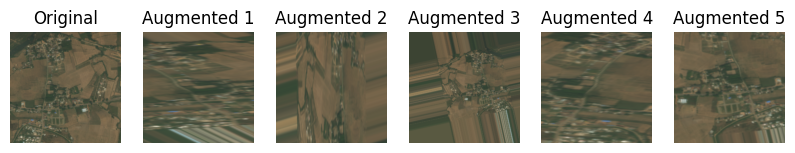

In [ ]:
import os
from datetime import datetime
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler


training_session_id = datetime.now().strftime("%Y-%m-%d %H-%M-%S")
training_session_folder = '/content/drive/MyDrive/ad-hoc_data/archive/train_%s' % (training_session_id)
os.makedirs(training_session_folder, exist_ok=True)

# Data augmentation
# datagen = ImageDataGenerator(
#     rotation_range=20,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     fill_mode='nearest'
# )

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.9,
    zoom_range=0.9,
    horizontal_flip=True,
    fill_mode='nearest',
)

val_datagen = ImageDataGenerator()

sample_index = 7

# Choose an example image and mask from X_train and y_train
example_image, example_mask = X_train[sample_index], y_train[sample_index]
example_image = np.expand_dims(example_image, axis=0)  # Add batch dimension
example_mask = np.expand_dims(example_mask, axis=0)  # Add batch dimension

# Generate augmented images
augmented_images = []
augmented_masks = []

augmented_images.append(example_image[0,:,:,:])
augmented_masks.append(example_mask[0,:,:,:])

print(len(augmented_images))
print(len(augmented_masks))

for batch in datagen.flow(np.concatenate([example_image, example_mask], axis=-1), batch_size=1, save_to_dir=None, shuffle=False):
  if len(augmented_images) < 6:
    # example_image has 3 channels RGB, example_mask has 7 channels corresponding to 7 labels
    augmented_images.append(batch[0,:,:,:3])
    augmented_masks.append(batch[0,:,:,3:])
  else:
    break

# Display the original and augmented images
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 6, 1)
plt.imshow(example_image[0])
plt.title('Original')
plt.axis('off')

# Augmented images
for i, augmented_img in enumerate(augmented_images):
  if i != 0:
    plt.subplot(1, 6, i + 1)
    plt.imshow(augmented_img)
    plt.title(f'Augmented {i}')
    plt.axis('off')

plt.show()

In [ ]:
augmented_images[0].shape

(224, 224, 3)

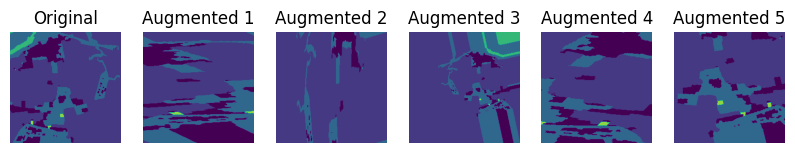

Shapes:
X_train: (642, 224, 224, 3)
X_val: (161, 224, 224, 3)
y_train: (642, 224, 224, 7)
y_val: (161, 224, 224, 7)


In [ ]:
# Display the original and augmented images
plt.figure(figsize=(10, 5))

# Original image
plt.subplot(1, 6, 1)
plt.imshow(np.argmax(augmented_masks[0], axis=-1) + 1, cmap='viridis', vmin=1, vmax=7)
plt.title('Original')
plt.axis('off')

# Augmented masks
for i, augmented_mask in enumerate(augmented_masks):
  if i != 0:
    plt.subplot(1, 6, i + 1)
    plt.imshow(np.argmax(augmented_mask, axis=-1) + 1, cmap='viridis', vmin=1, vmax=7)
    plt.title(f'Augmented {i}')
    plt.axis('off')

plt.show()

print("Shapes:")
print("X_train:", X_train.shape)
print("X_val:", X_val.shape)
print("y_train:", y_train.shape)
print("y_val:", y_val.shape)\

# del y_one_hot, X_npy, y_npy

In [ ]:
from keras import backend as K

def jaccard_coef(y_true, y_pred):
  y_true_flatten = K.flatten(y_true)
  y_pred_flatten = K.flatten(y_pred)
  intersection = K.sum(y_true_flatten * y_pred_flatten)
  final_coef_value = (intersection + 1.0) / (K.sum(y_true_flatten) + K.sum(y_pred_flatten) - intersection + 1.0)
  return final_coef_value

In [ ]:
# Learning rate scheduler function
def lr_scheduler(epoch, lr):
  if epoch < 10:
    return lr
  else:
    return lr * tf.math.exp(-0.1)

# Learning rate scheduler callback
lr_scheduler_callback = LearningRateScheduler(lr_scheduler)

# Callbacks list with ModelCheckpoint and LearningRateScheduler
callbacks_list = [
    keras.callbacks.ModelCheckpoint(
        filepath=training_session_folder + '/u_net_model.{epoch:04d}-acc-{accuracy:4.2f}-val_acc-{val_accuracy:4.2f}-loss-{val_loss:4.2f}.h5',
        monitor='loss', save_best_only=True),
    lr_scheduler_callback
]

# Compile the model with Categorical Crossentropy loss
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', jaccard_coef])

In [ ]:
# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
)

# Training loop
epochs = 100
batch_size = 32

# Use the iterators in your training loop
steps_per_epoch = len(X_train) // batch_size
validation_steps = len(X_val) // batch_size

# Create iterators for the training and validation data
train_iterator = datagen.flow(X_train, y_train, batch_size=batch_size)
val_iterator = datagen.flow(X_val, y_val, batch_size=batch_size)

# Training with fit function
history = model.fit(train_iterator, steps_per_epoch=steps_per_epoch,
                    validation_data=val_iterator, validation_steps=validation_steps,
                    epochs=epochs, callbacks=callbacks_list)

Epoch 1/100
20/20 [==============================] - ETA: 0s - loss: 1.3835 - accuracy: 0.5449 - jaccard_coef: 0.2521

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


20/20 [==============================] - 75s 1s/step - loss: 1.3835 - accuracy: 0.5449 - jaccard_coef: 0.2521 - val_loss: 1.6997 - val_accuracy: 0.5664 - val_jaccard_coef: 0.1047 - lr: 0.0010
Epoch 2/100
20/20 [==============================] - 19s 959ms/step - loss: 1.1807 - accuracy: 0.6041 - jaccard_coef: 0.2836 - val_loss: 1.5636 - val_accuracy: 0.5691 - val_jaccard_coef: 0.1304 - lr: 0.0010
Epoch 3/100
20/20 [==============================] - 19s 948ms/step - loss: 1.1464 - accuracy: 0.6120 - jaccard_coef: 0.3117 - val_loss: 1.4237 - val_accuracy: 0.5725 - val_jaccard_coef: 0.1811 - lr: 0.0010
Epoch 4/100
20/20 [==============================] - 19s 949ms/step - loss: 1.1357 - accuracy: 0.6215 - jaccard_coef: 0.2944 - val_loss: 1.3928 - val_accuracy: 0.5697 - val_jaccard_coef: 0.1926 - lr: 0.0010
Epoch 5/100
20/20 [==============================] - 19s 959ms/step - loss: 1.1176 - accuracy: 0.6261 - jaccard_coef: 0.3125 - val_loss: 1.3879 - val_accuracy: 0.5677 - val_jaccard_coef: 

In [ ]:
# 3 - Load checkpointed model for continuation of training or predict validation set
from tensorflow.keras.models import load_model

# model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-08 10-35-12/u_net_model.0001-acc-0.71-val_acc-0.73-loss-0.79.h5')
# model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-17 07-01-43/u_net_model.0085-acc-0.73-val_acc-0.73-loss-0.86.h5')

1/1 [==============================] - 2s 2s/step


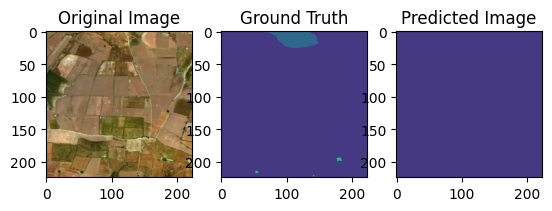

[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [2 3 5]
The unique predicted class labels are [2]
1/1 [==============================] - 0s 19ms/step


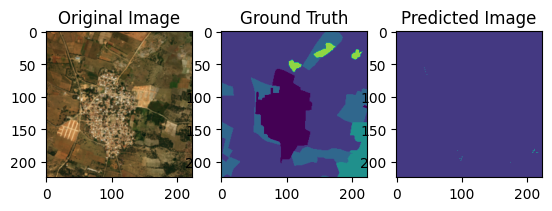

[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 6]
The unique predicted class labels are [2 4 6]
1/1 [==============================] - 0s 18ms/step


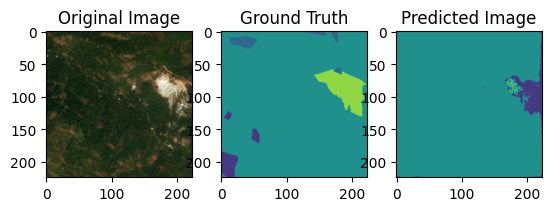

[[4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 4 2 2]
 ...
 [2 4 4 ... 4 2 2]
 [2 4 4 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [2 3 4 6]
The unique predicted class labels are [1 2 3 4 5 6]
1/1 [==============================] - 0s 19ms/step


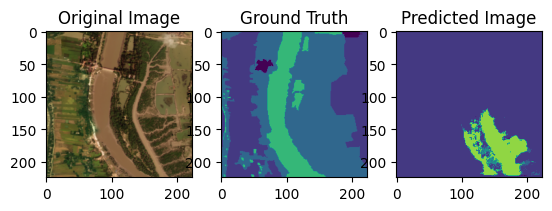

[[3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]
 ...
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]
 [3 3 3 ... 3 3 3]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [1 2 3 4 6]
1/1 [==============================] - 0s 18ms/step


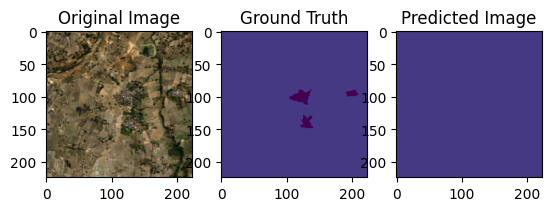

[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
1/1 [==============================] - 0s 21ms/step


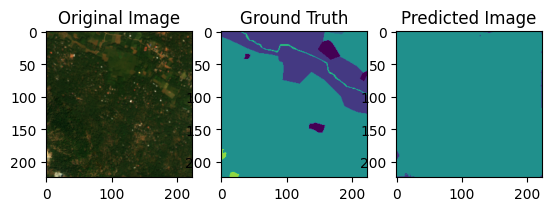

[[2 2 2 ... 4 4 4]
 [2 2 2 ... 4 4 4]
 [2 2 2 ... 4 4 4]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 4 2 2]
 [2 4 4 ... 4 4 2]
 ...
 [2 4 4 ... 4 4 2]
 [2 4 4 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [2 4]
1/1 [==============================] - 0s 18ms/step


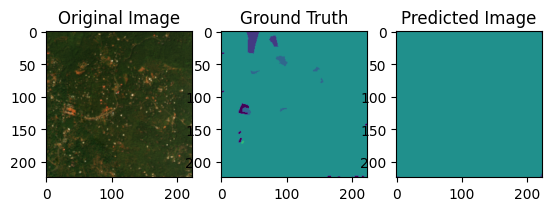

[[4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
[[2 2 2 ... 4 2 2]
 [2 2 2 ... 4 2 2]
 [2 2 4 ... 4 4 2]
 ...
 [2 4 4 ... 4 4 2]
 [2 4 4 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [2 4]
1/1 [==============================] - 0s 19ms/step


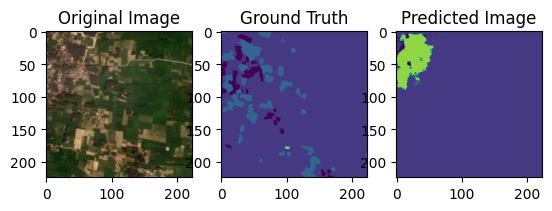

[[3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [1 2 3 6]
1/1 [==============================] - 0s 21ms/step


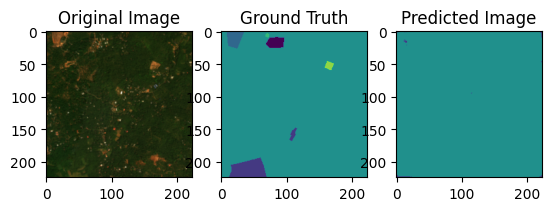

[[4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 4 ... 4 2 2]
 ...
 [2 2 2 ... 4 4 2]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [2 3 4]
1/1 [==============================] - 0s 18ms/step


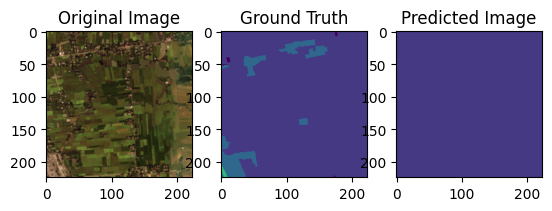

[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
1/1 [==============================] - 0s 18ms/step


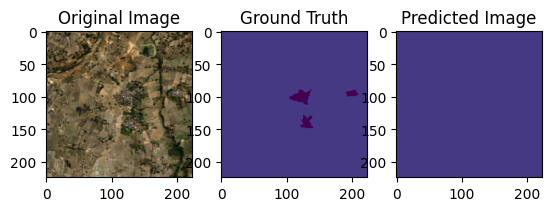

[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
1/1 [==============================] - 0s 17ms/step


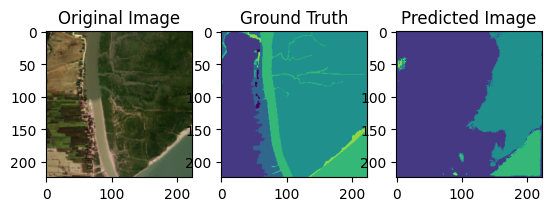

[[3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]
 ...
 [2 2 2 ... 5 5 5]
 [2 2 2 ... 5 5 5]
 [2 2 2 ... 5 5 5]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 4 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [1 2 4 5 6]
1/1 [==============================] - 0s 19ms/step


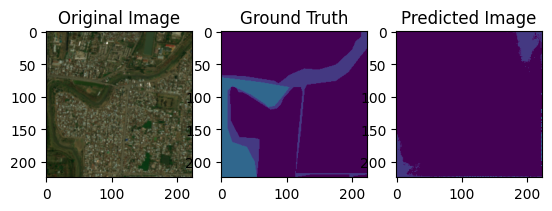

[[1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [3 3 3 ... 1 1 1]
 [3 3 3 ... 1 1 1]
 [3 3 3 ... 1 1 1]]
[[2 2 2 ... 2 2 2]
 [2 1 1 ... 2 2 2]
 [1 1 1 ... 2 2 2]
 ...
 [2 2 2 ... 1 1 1]
 [2 2 2 ... 1 1 1]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3]
The unique predicted class labels are [1 2 3 6]
1/1 [==============================] - 0s 18ms/step


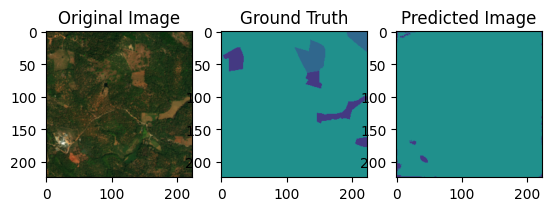

[[4 4 4 ... 3 3 3]
 [4 4 4 ... 3 3 3]
 [4 4 4 ... 3 3 3]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 4 4 2]
 ...
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [2 3 4]
The unique predicted class labels are [2 3 4]
1/1 [==============================] - 0s 18ms/step


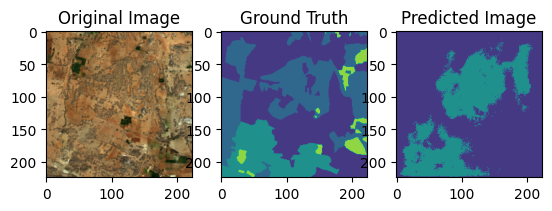

[[2 2 2 ... 3 3 3]
 [2 2 2 ... 3 3 3]
 [2 2 2 ... 3 3 3]
 ...
 [4 4 4 ... 2 2 2]
 [4 4 4 ... 2 2 2]
 [4 4 4 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [2 3 4 6]
The unique predicted class labels are [2 4]
1/1 [==============================] - 0s 19ms/step


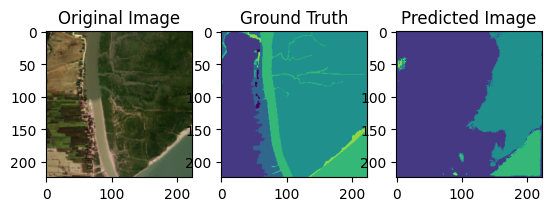

[[3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]
 ...
 [2 2 2 ... 5 5 5]
 [2 2 2 ... 5 5 5]
 [2 2 2 ... 5 5 5]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 4 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [1 2 4 5 6]
1/1 [==============================] - 0s 19ms/step


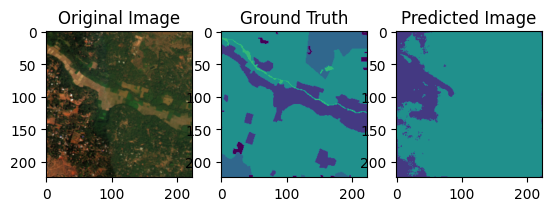

[[4 4 4 ... 3 3 1]
 [4 4 4 ... 3 1 1]
 [4 4 4 ... 1 1 1]
 ...
 [3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]
 [3 3 3 ... 4 4 4]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 4 2 2]
 ...
 [2 2 2 ... 4 4 4]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [2 3 4 5]
1/1 [==============================] - 0s 18ms/step


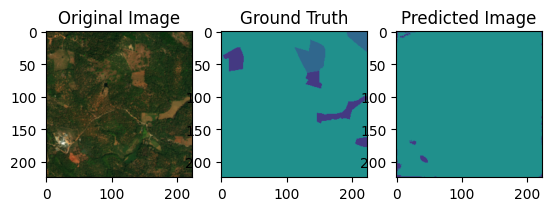

[[4 4 4 ... 3 3 3]
 [4 4 4 ... 3 3 3]
 [4 4 4 ... 3 3 3]
 ...
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 4 4 2]
 ...
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [2 3 4]
The unique predicted class labels are [2 3 4]
1/1 [==============================] - 0s 20ms/step


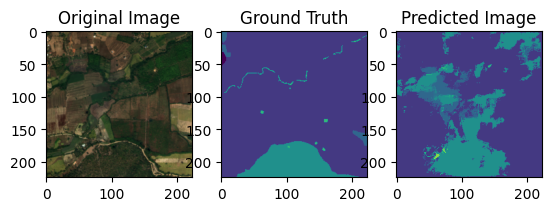

[[3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]
 [3 3 3 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [2 3 4 5 6]
1/1 [==============================] - 0s 19ms/step


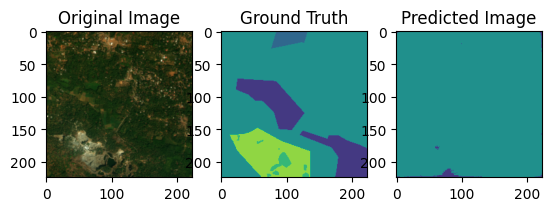

[[4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 [4 4 4 ... 4 4 4]
 ...
 [4 4 4 ... 2 2 2]
 [4 4 4 ... 2 2 2]
 [4 4 4 ... 2 2 2]]
[[2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 [2 2 2 ... 2 2 2]
 ...
 [2 4 4 ... 4 2 2]
 [2 4 4 ... 4 2 2]
 [2 2 2 ... 2 2 2]]
The unique GT class labels are [2 3 4 5 6]
The unique predicted class labels are [1 2 4]


In [ ]:
from tensorflow.keras.preprocessing.image import array_to_img

# Prediction loop
num_samples_to_predict = 20  # change here for the number of images to predict

for _ in range(num_samples_to_predict):
    # Generate a random index for prediction
    random_index = np.random.randint(0, len(X_val))

    # Select a sample from the validation set
    sample_image = X_val[random_index]
    sample_one_hot_label = y_val[random_index]

    # Expand dimensions to match the model input shape
    sample_image = np.expand_dims(sample_image, axis=0)

    # Make the prediction
    predictions = model.predict(sample_image)

    # Convert predictions to categorical indices
    predicted_label_indices = np.argmax(predictions, axis=-1) + 1

    # Convert one-hot encoded label to categorical indices
    sample_label_indices = np.argmax(sample_one_hot_label, axis=-1) + 1

    # Display the original image
    plt.subplot(1, 3, 1)
    plt.imshow(array_to_img(sample_image.squeeze()))
    plt.title("Original Image")

    # Display the ground truth (categorical indices, one-indexed)
    plt.subplot(1, 3, 2)
    plt.imshow(sample_label_indices, cmap='viridis', vmin=1, vmax=7)
    plt.title("Ground Truth")

    # Display the predicted image (categorical index, one-indexed)
    plt.subplot(1, 3, 3)
    plt.imshow(predicted_label_indices.squeeze(), cmap='viridis', vmin=1, vmax=7)
    plt.title("Predicted Image")

    plt.show()
    print(sample_label_indices)
    print(predicted_label_indices.squeeze())
    print(f'The unique GT class labels are {np.unique(sample_label_indices)}')
    print(f'The unique predicted class labels are {np.unique(predicted_label_indices.squeeze())}')

Display classification metric report

In [ ]:
# Create list of land cover categorical labels that correspond to the predicted index labels
labels = ['urban_land', 'agriculture_land', 'rangeland', 'forest_land', 'water', 'barren_land', 'unknown']

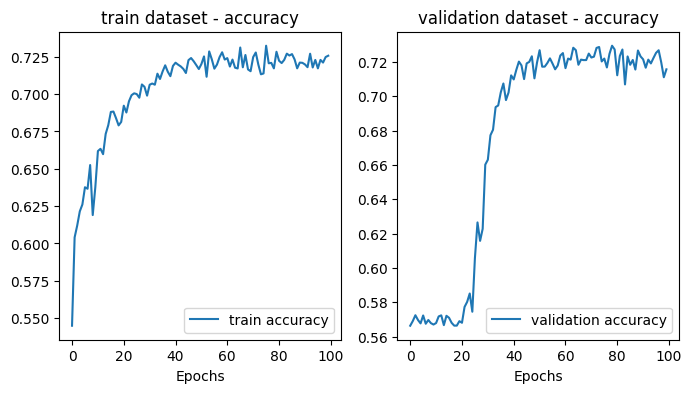

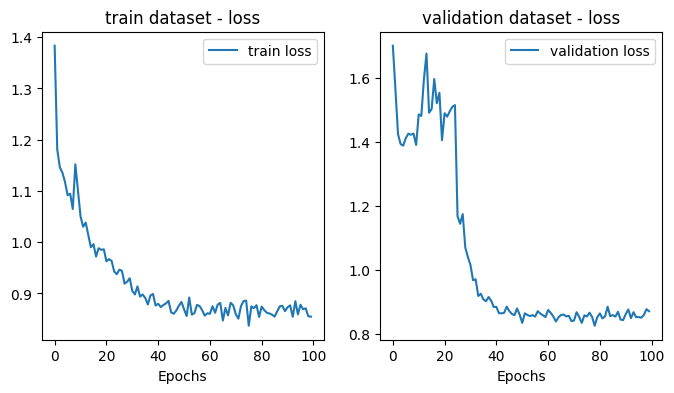

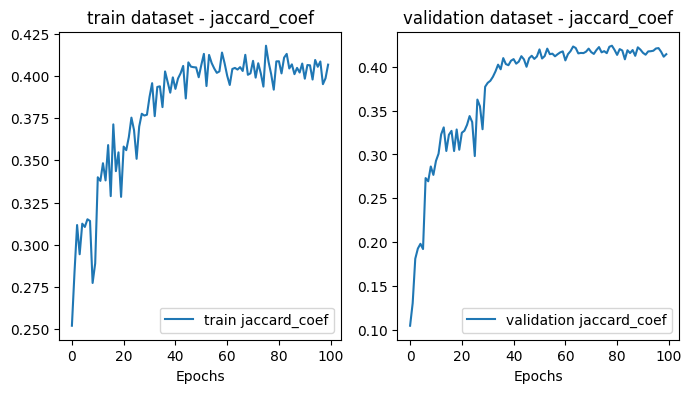

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

def display_metrics(history, metric='accuracy'):
    plt.figure(figsize=(8, 4))

    # Train Data Metrics
    plt.subplot(1, 2, 1)
    plt.plot(history.history[metric], label=f'train {metric}')
    plt.title(f'train dataset - {metric}')
    plt.xlabel('Epochs')
    plt.legend()

    # Test Data Metrics
    plt.subplot(1, 2, 2)
    val_metric = f'val_{metric}'  # Use val_accuracy and val_loss for validation metrics
    plt.plot(history.history[val_metric], label=f'validation {metric}')
    plt.title(f'validation dataset - {metric}')
    plt.xlabel('Epochs')
    plt.legend()

    plt.show()

# Assuming `history` is the history object returned by model.fit
display_metrics(history, 'accuracy')
display_metrics(history, 'loss')
display_metrics(history, 'jaccard_coef')


Display classification report and confusion matrix

In [ ]:
# convert y_train and y_val from one-hot encoding formatted predictions to categorical labels

# Convert predictions to categorical indices
# y_train_index = np.argmax(y_train, axis=-1)
# y_val_index = np.argmax(y_val, axis=-1)

In [ ]:
# y_train_index = y_train.reshape(1, -1)
# y_val_index = y_val.reshape(1, -1)

print(y_train.shape)

(642, 224, 224, 7)


In [ ]:
import numpy as np

# Assuming your array is named 'original_array'
original_shape = (2, 256, 256, 7)
original_array = np.random.random(original_shape)

# Reshape the array
flattened_array = original_array.reshape(-1, original_shape[-1])

print(original_shape[-1])

print(flattened_array.shape)


7
(131072, 7)


6/6 [==============================] - 1s 262ms/step


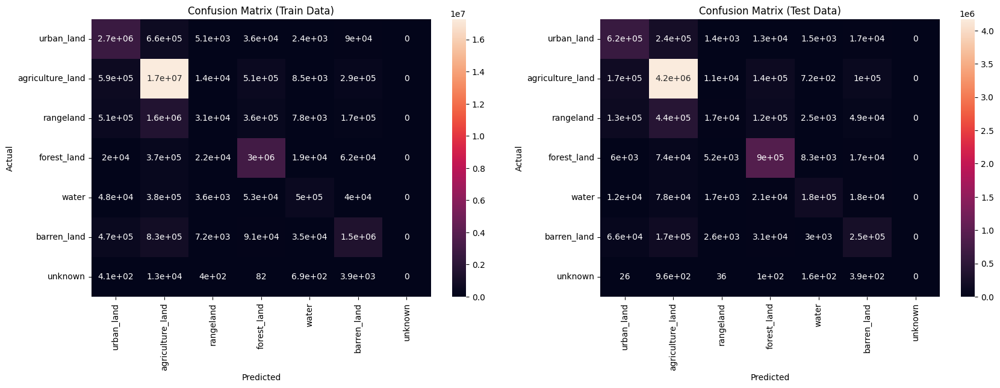

In [ ]:
from sklearn.metrics import confusion_matrix
from keras.utils import to_categorical
import seaborn as sns
import pandas as pd


def display_confusion_matrix(keras_model, x_train, y_train, x_test, y_test, labels):

    actual_y_train = keras_model.predict(x_train)
    actual_y_test = keras_model.predict(x_test)

    plt.figure(figsize=(20,6))

    labels = np.array(labels)


    # Convert the target labels into the categorical index
    #
    y_train_index = y_train.argmax(axis=-1)
    actual_y_train_index = actual_y_train.argmax(axis=-1)
    y_test_index = y_test.argmax(axis=-1)
    actual_y_test_index = actual_y_test.argmax(axis=-1)


    # Convert the matrix to an column array
    y_train_index = y_train_index.reshape(1, -1).flatten()
    actual_y_train_index = actual_y_train_index.reshape(1, -1).flatten()

    y_test_index = y_test_index.reshape(1, -1).flatten()
    actual_y_test_index = actual_y_test_index.reshape(1, -1).flatten()


    # Print the first Confusion Matrix for the training data
    #
    cm = confusion_matrix(y_train_index, actual_y_train_index)

    cm_df = pd.DataFrame(cm, labels, labels)
    plt.subplot(1, 2, 1)
    plt.title('Confusion Matrix (Train Data)')
    sns.heatmap(cm_df, annot=True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')

    # Print the second Confusion Matrix for the test data
    #
    cm = confusion_matrix(y_test_index, actual_y_test_index)


    cm_df = pd.DataFrame(cm, labels, labels)
    plt.subplot(1, 2, 2)
    plt.title('Confusion Matrix (Test Data)')
    sns.heatmap(cm_df, annot=True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')

    plt.show()


# Exclude the O tags from the confusion matrix.
#
display_confusion_matrix(model, X_train, y_train, X_val, y_val, labels)

In [ ]:
from tensorflow.keras.models import load_model

model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-14 11-20-17/u_net_model.0098-acc-0.75-val_acc-0.74-loss-0.79.h5')

6/6 [==============================] - 1s 267ms/step


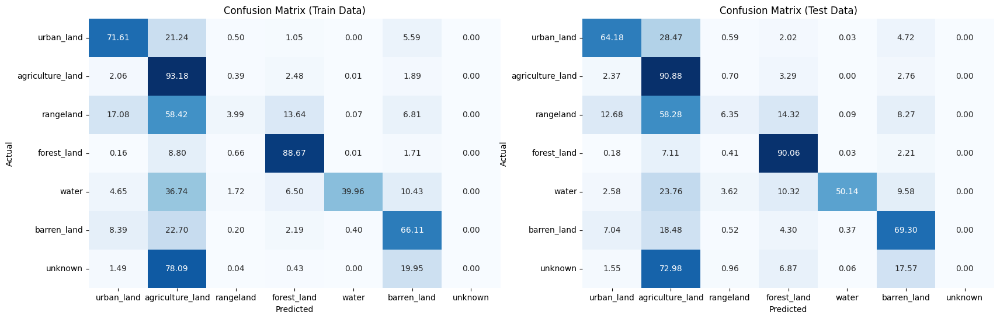

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from keras.utils import to_categorical
import seaborn as sns
import pandas as pd

def display_confusion_matrix_as_pct(keras_model, x_train, y_train, x_test, y_test, labels):
    actual_y_train = keras_model.predict(x_train)
    actual_y_test = keras_model.predict(x_test)

    plt.figure(figsize=(20, 6))

    labels = np.array(labels)

    # Convert the target labels into the categorical index
    y_train_index = y_train.argmax(axis=-1)
    actual_y_train_index = actual_y_train.argmax(axis=-1)
    y_test_index = y_test.argmax(axis=-1)
    actual_y_test_index = actual_y_test.argmax(axis=-1)

    # Convert the matrix to a column array
    y_train_index = y_train_index.reshape(1, -1).flatten()
    actual_y_train_index = actual_y_train_index.reshape(1, -1).flatten()
    y_test_index = y_test_index.reshape(1, -1).flatten()
    actual_y_test_index = actual_y_test_index.reshape(1, -1).flatten()

    def plot_confusion_matrix(ax, y_true, y_pred, title):
        cm = confusion_matrix(y_true, y_pred)
        cm_percentage = cm / cm.sum(axis=1, keepdims=True) * 100  # Calculate percentages

        cm_df = pd.DataFrame(cm_percentage, labels, labels)
        sns.heatmap(cm_df, annot=True, fmt=".2f", cmap="Blues", cbar=False, ax=ax)
        ax.set_title(title)
        ax.set_ylabel('Actual')
        ax.set_xlabel('Predicted')


    # Plot the first Confusion Matrix for the training data
    ax1 = plt.subplot(1, 2, 1)
    plot_confusion_matrix(ax1, y_train_index, actual_y_train_index, 'Confusion Matrix (Train Data)')

    # Plot the second Confusion Matrix for the test data
    ax2 = plt.subplot(1, 2, 2)
    plot_confusion_matrix(ax2, y_test_index, actual_y_test_index, 'Confusion Matrix (Test Data)')

    plt.show()

# Assuming you have x_train, y_train, x_test, y_test, labels defined
# model is your trained Keras model
display_confusion_matrix_as_pct(model, X_train, y_train, X_val, y_val, labels)


## Ensemble prediction

In [ ]:
def ensemble_predict(X_array, unet_model, vgg16_model, resnet50_model):
    #
    # Call the predict methods of the unet_model and the vgg16_unet_model
    # to retrieve their predictions.
    #
    # Sum the two predictions together and return their results.
    # You can also consider multiplying a different weight on
    # one or both of the models to improve performance

    pred_y_unet = unet_model.predict(X_array)
    pred_y_vgg16 = vgg16_model.predict(X_array)
    pred_y_resnet50 = resnet50_model.predict(X_array)

    return (pred_y_unet + pred_y_vgg16 + pred_y_resnet50) / 3

In [ ]:
# 3 - Load checkpointed model for ensemble prediction and gradio deployment
from tensorflow.keras.models import load_model

unet_model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-14 11-20-17/u_net_model.0098-acc-0.75-val_acc-0.74-loss-0.79.h5')
vgg16_model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-14 05-29-53/u_net_model.0092-acc-0.74-val_acc-0.74-loss-0.82.h5')
resnet50_model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-17 07-01-43/u_net_model.0095-acc-0.79-val_acc-0.76-loss-0.72.h5')

6/6 [==============================] - 3s 495ms/step


<ipython-input-28-3a4420cc77e3>:29: RuntimeWarning: invalid value encountered in divide
  cm_percentage = cm / cm.sum(axis=0, keepdims=True) * 100  # Calculate percentages
<ipython-input-28-3a4420cc77e3>:29: RuntimeWarning: invalid value encountered in divide
  cm_percentage = cm / cm.sum(axis=0, keepdims=True) * 100  # Calculate percentages


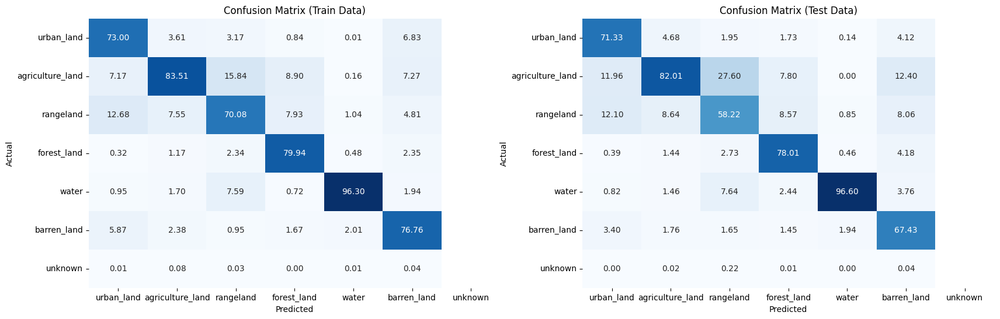

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from keras.utils import to_categorical
import seaborn as sns
import pandas as pd

def display_confusion_matrix_as_pct(x_train, y_train, x_test, y_test, labels):
    actual_y_train = ensemble_predict(x_train, unet_model, vgg16_model, resnet50_model)
    actual_y_test = ensemble_predict(x_test, unet_model, vgg16_model, resnet50_model)

    plt.figure(figsize=(20, 6))

    labels = np.array(labels)

    # Convert the target labels into the categorical index
    y_train_index = y_train.argmax(axis=-1)
    actual_y_train_index = actual_y_train.argmax(axis=-1)
    y_test_index = y_test.argmax(axis=-1)
    actual_y_test_index = actual_y_test.argmax(axis=-1)

    # Convert the matrix to a column array
    y_train_index = y_train_index.reshape(1, -1).flatten()
    actual_y_train_index = actual_y_train_index.reshape(1, -1).flatten()
    y_test_index = y_test_index.reshape(1, -1).flatten()
    actual_y_test_index = actual_y_test_index.reshape(1, -1).flatten()

    def plot_confusion_matrix(ax, y_true, y_pred, title):
        cm = confusion_matrix(y_true, y_pred)
        cm_percentage = cm / cm.sum(axis=0, keepdims=True) * 100  # Calculate percentages

        cm_df = pd.DataFrame(cm_percentage, labels, labels)
        sns.heatmap(cm_df, annot=True, fmt=".2f", cmap="Blues", cbar=False, ax=ax)
        ax.set_title(title)
        ax.set_ylabel('Actual')
        ax.set_xlabel('Predicted')

    # Plot the first Confusion Matrix for the training data
    ax1 = plt.subplot(1, 2, 1)
    plot_confusion_matrix(ax1, y_train_index, actual_y_train_index, 'Confusion Matrix (Train Data)')

    # Plot the second Confusion Matrix for the test data
    ax2 = plt.subplot(1, 2, 2)
    plot_confusion_matrix(ax2, y_test_index, actual_y_test_index, 'Confusion Matrix (Test Data)')

    plt.show()

# Assuming you have x_train, y_train, x_test, y_test, labels defined
# model is your trained Keras model
display_confusion_matrix_as_pct(X_train, y_train, X_val, y_val, labels)


## Ensemble Prediction

161
0
1/1 [==============================] - 0s 21ms/step


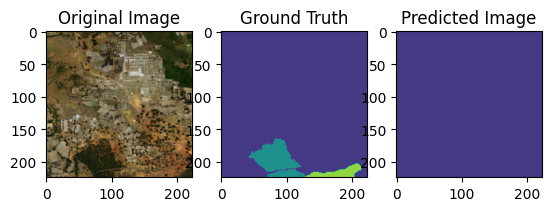

The unique GT class labels are [2 4 6]
The unique predicted class labels are [2]
1
1/1 [==============================] - 0s 21ms/step


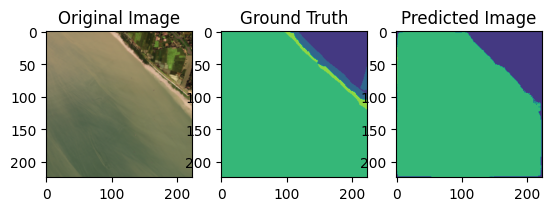

The unique GT class labels are [2 3 5 6]
The unique predicted class labels are [2 4 5 6]
2
1/1 [==============================] - 0s 20ms/step


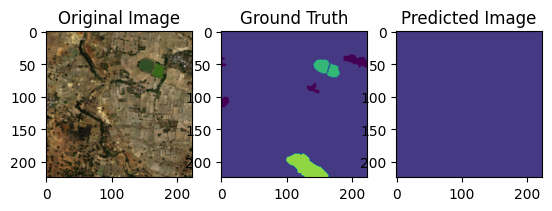

The unique GT class labels are [1 2 5 6]
The unique predicted class labels are [2]
3
1/1 [==============================] - 0s 21ms/step


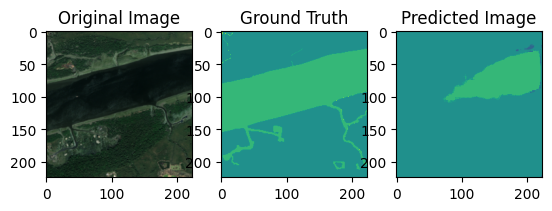

The unique GT class labels are [4 5 6 7]
The unique predicted class labels are [2 3 4 5]
4
1/1 [==============================] - 0s 20ms/step


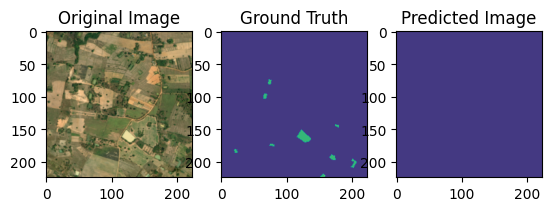

The unique GT class labels are [2 5 7]
The unique predicted class labels are [2]
5
1/1 [==============================] - 0s 20ms/step


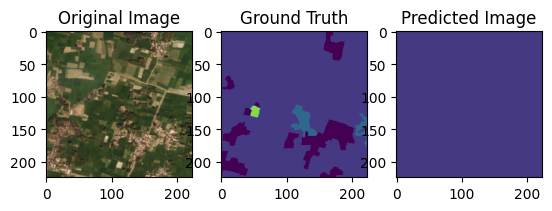

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
6
1/1 [==============================] - 0s 20ms/step


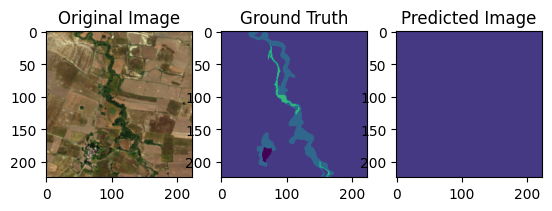

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
7
1/1 [==============================] - 0s 22ms/step


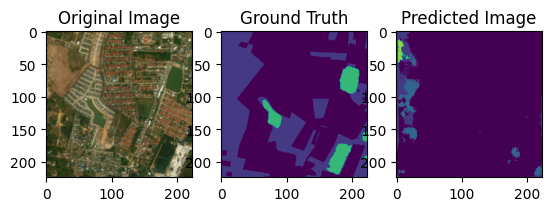

The unique GT class labels are [1 2 5]
The unique predicted class labels are [1 2 3 4 6]
8
1/1 [==============================] - 0s 24ms/step


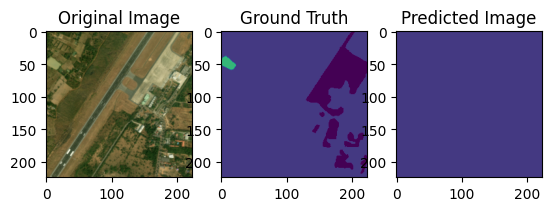

The unique GT class labels are [1 2 5]
The unique predicted class labels are [2]
9
1/1 [==============================] - 0s 21ms/step


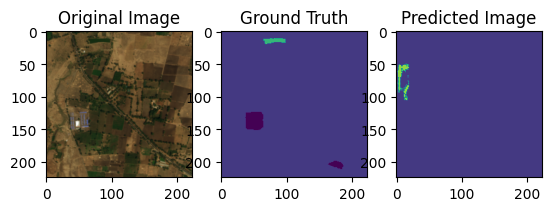

The unique GT class labels are [1 2 5 6]
The unique predicted class labels are [2 6]
10
1/1 [==============================] - 0s 22ms/step


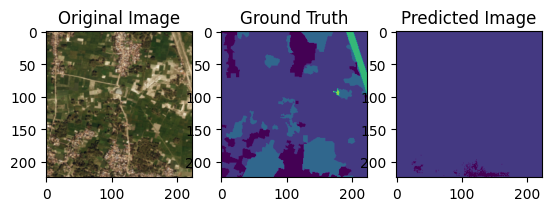

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2]
11
1/1 [==============================] - 0s 21ms/step


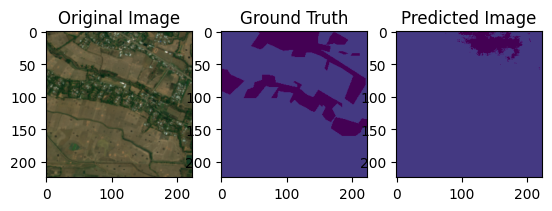

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
12
1/1 [==============================] - 0s 22ms/step


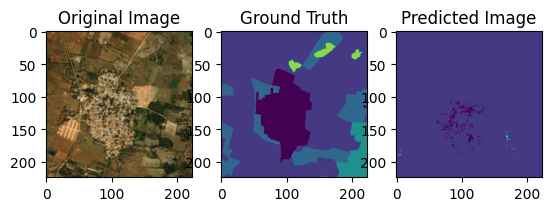

The unique GT class labels are [1 2 3 4 6]
The unique predicted class labels are [1 2 6]
13
1/1 [==============================] - 0s 20ms/step


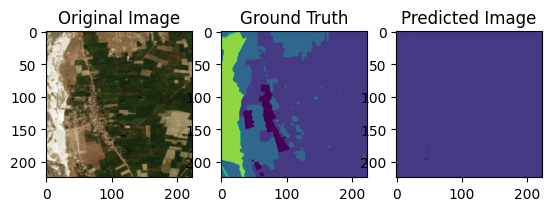

The unique GT class labels are [1 2 3 5 6 7]
The unique predicted class labels are [1 2 3]
14
1/1 [==============================] - 0s 20ms/step


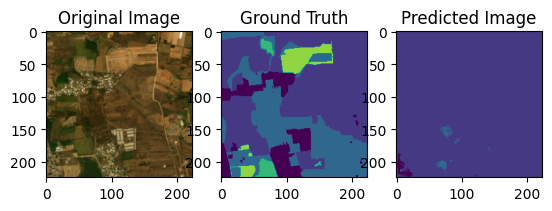

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2 3]
15
1/1 [==============================] - 0s 20ms/step


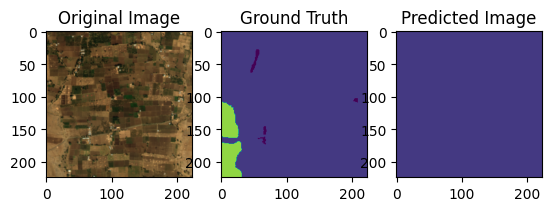

The unique GT class labels are [1 2 6]
The unique predicted class labels are [2]
16
1/1 [==============================] - 0s 22ms/step


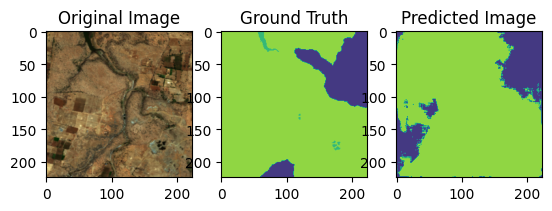

The unique GT class labels are [2 5 6]
The unique predicted class labels are [1 2 4 6]
17
1/1 [==============================] - 0s 20ms/step


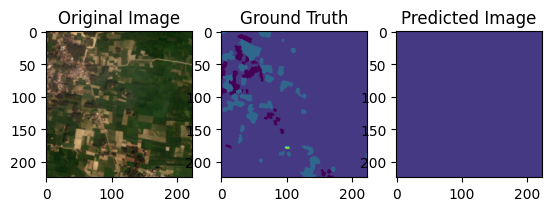

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
18
1/1 [==============================] - 0s 22ms/step


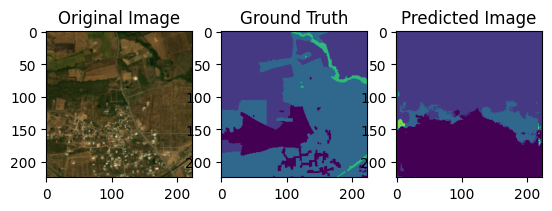

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [1 2 3 4 6]
19
1/1 [==============================] - 0s 20ms/step


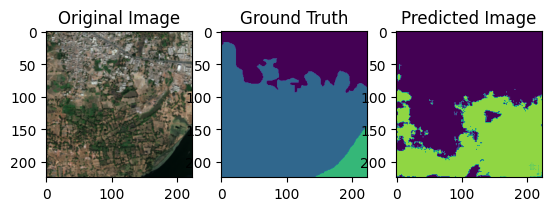

The unique GT class labels are [1 3 5]
The unique predicted class labels are [1 2 3 4 5 6]
20
1/1 [==============================] - 0s 20ms/step


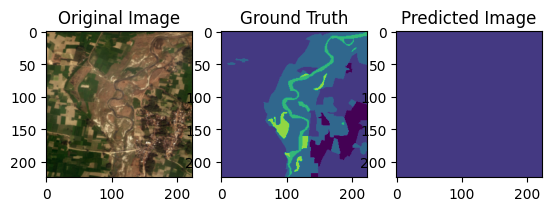

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
21
1/1 [==============================] - 0s 21ms/step


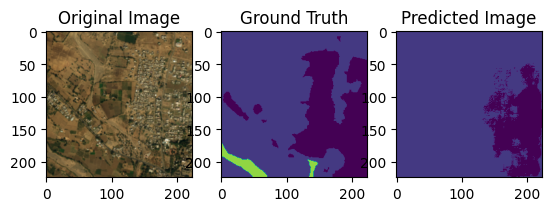

The unique GT class labels are [1 2 6]
The unique predicted class labels are [1 2 3]
22
1/1 [==============================] - 0s 22ms/step


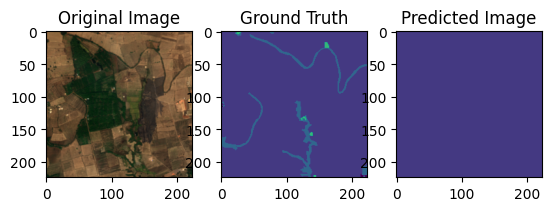

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
23
1/1 [==============================] - 0s 21ms/step


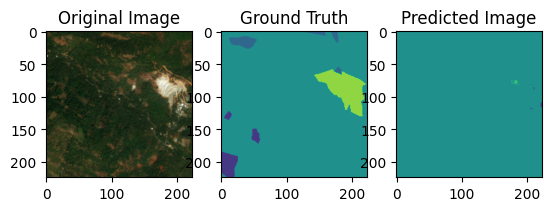

The unique GT class labels are [2 3 4 6]
The unique predicted class labels are [1 2 4 6]
24
1/1 [==============================] - 0s 22ms/step


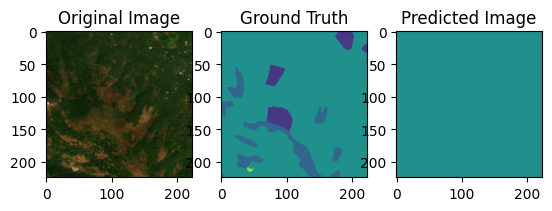

The unique GT class labels are [2 3 4 6]
The unique predicted class labels are [2 4]
25
1/1 [==============================] - 0s 21ms/step


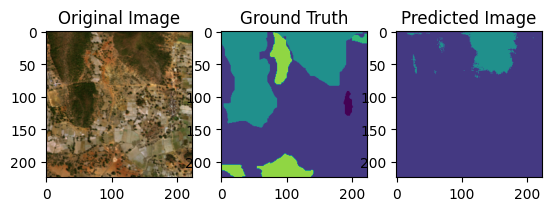

The unique GT class labels are [1 2 4 5 6]
The unique predicted class labels are [2 4]
26
1/1 [==============================] - 0s 20ms/step


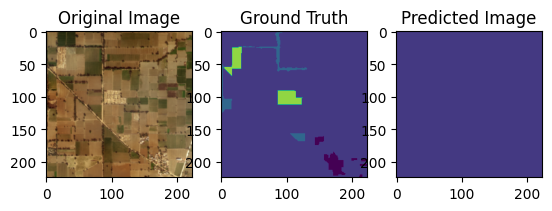

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
27
1/1 [==============================] - 0s 21ms/step


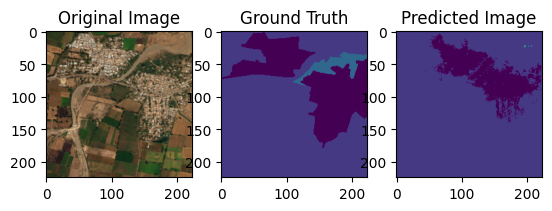

The unique GT class labels are [1 2 3]
The unique predicted class labels are [1 2 3 6]
28
1/1 [==============================] - 0s 21ms/step


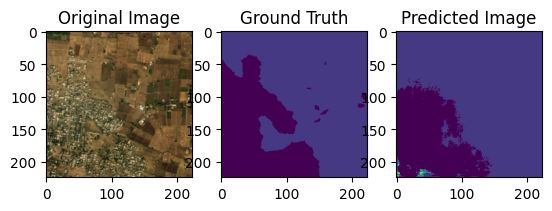

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2 6]
29
1/1 [==============================] - 0s 22ms/step


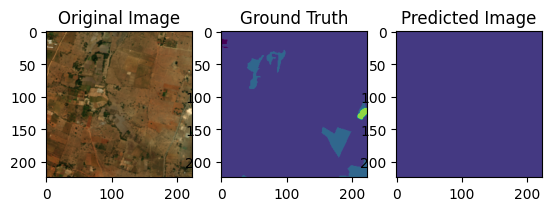

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
30
1/1 [==============================] - 0s 20ms/step


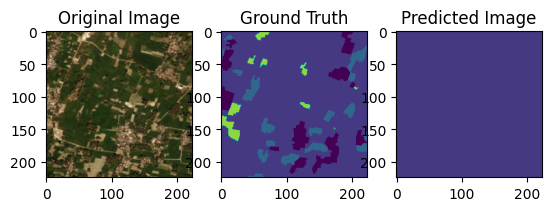

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
31
1/1 [==============================] - 0s 21ms/step


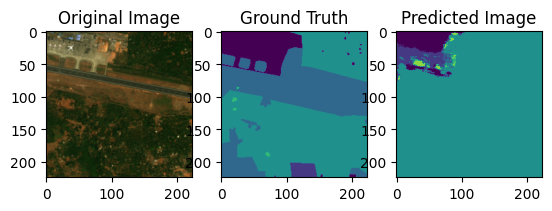

The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [1 2 3 4 6]
32
1/1 [==============================] - 0s 20ms/step


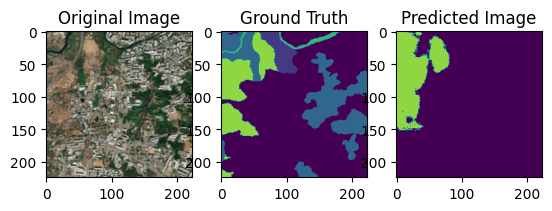

The unique GT class labels are [1 2 3 5 6 7]
The unique predicted class labels are [1 2 3 6]
33
1/1 [==============================] - 0s 21ms/step


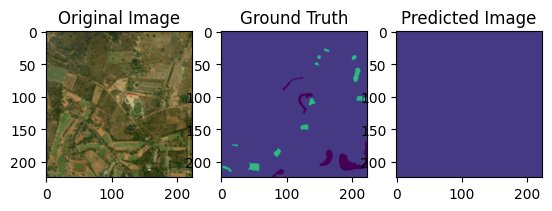

The unique GT class labels are [1 2 5]
The unique predicted class labels are [2]
34
1/1 [==============================] - 0s 21ms/step


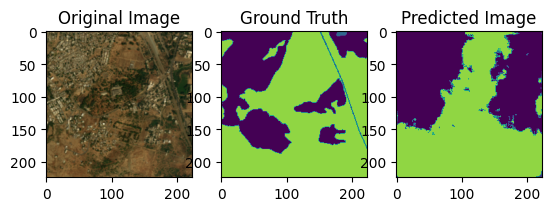

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [1 2 6]
35
1/1 [==============================] - 0s 20ms/step


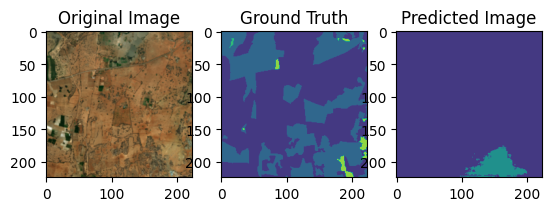

The unique GT class labels are [2 3 5 6]
The unique predicted class labels are [2 4 6]
36
1/1 [==============================] - 0s 20ms/step


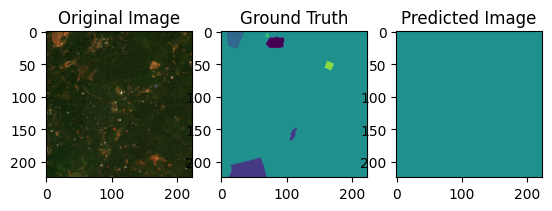

The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [4]
37
1/1 [==============================] - 0s 20ms/step


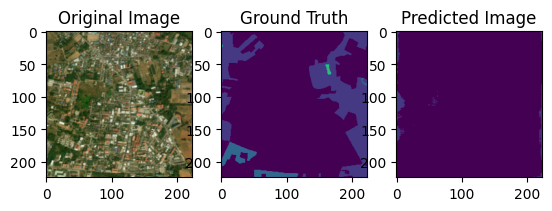

The unique GT class labels are [1 2 3 5 7]
The unique predicted class labels are [1 2]
38
1/1 [==============================] - 0s 20ms/step


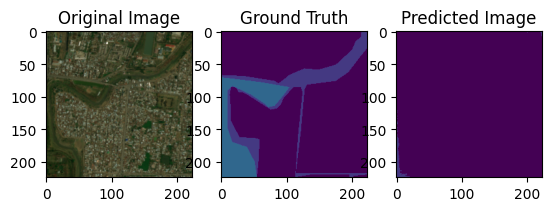

The unique GT class labels are [1 2 3]
The unique predicted class labels are [1 2]
39
1/1 [==============================] - 0s 20ms/step


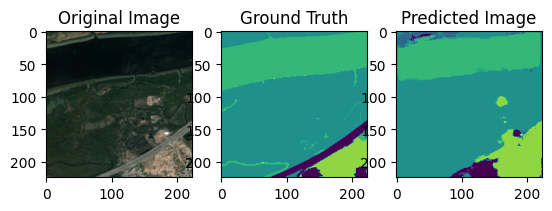

The unique GT class labels are [1 3 4 5 6 7]
The unique predicted class labels are [1 2 3 4 5 6]
40
1/1 [==============================] - 0s 21ms/step


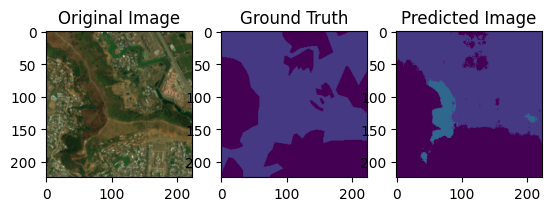

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2 3]
41
1/1 [==============================] - 0s 23ms/step


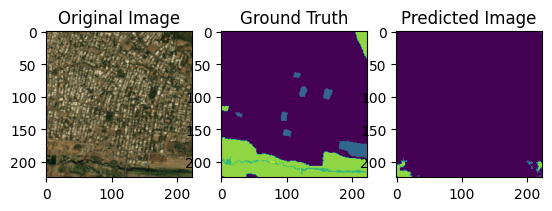

The unique GT class labels are [1 3 5 6 7]
The unique predicted class labels are [1 2 6]
42
1/1 [==============================] - 0s 21ms/step


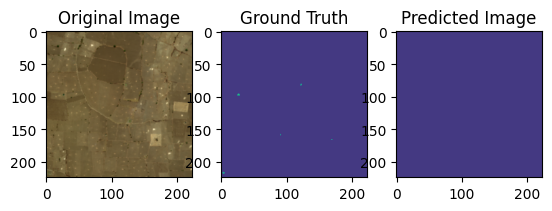

The unique GT class labels are [2 5]
The unique predicted class labels are [2]
43
1/1 [==============================] - 0s 21ms/step


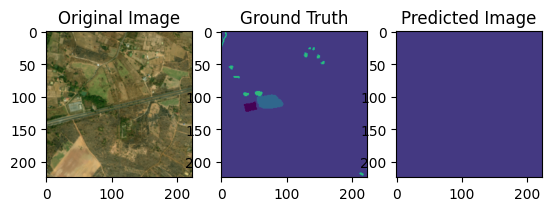

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
44
1/1 [==============================] - 0s 21ms/step


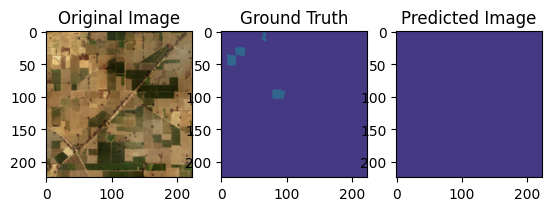

The unique GT class labels are [2 3]
The unique predicted class labels are [2]
45
1/1 [==============================] - 0s 21ms/step


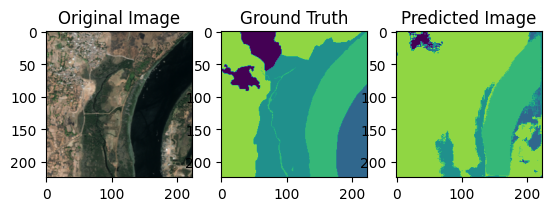

The unique GT class labels are [1 3 4 5 6]
The unique predicted class labels are [1 2 3 4 5 6]
46
1/1 [==============================] - 0s 22ms/step


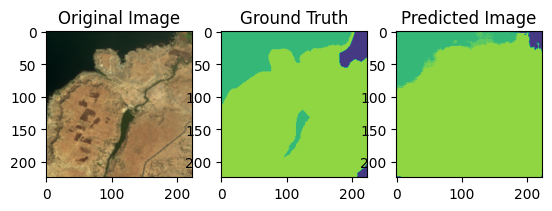

The unique GT class labels are [2 5 6]
The unique predicted class labels are [2 4 5 6]
47
1/1 [==============================] - 0s 20ms/step


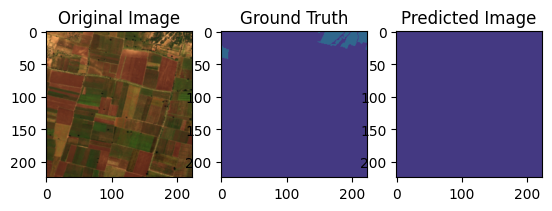

The unique GT class labels are [2 3]
The unique predicted class labels are [2]
48
1/1 [==============================] - 0s 22ms/step


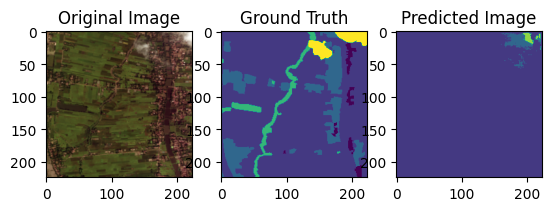

The unique GT class labels are [1 2 3 5 7]
The unique predicted class labels are [2 3 6]
49
1/1 [==============================] - 0s 22ms/step


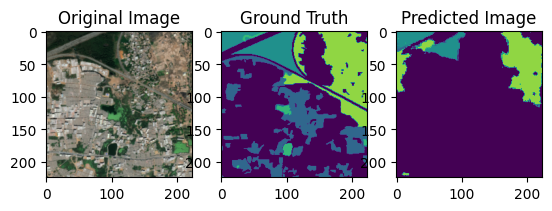

The unique GT class labels are [1 3 4 5 6]
The unique predicted class labels are [1 2 3 4 6]
50
1/1 [==============================] - 0s 22ms/step


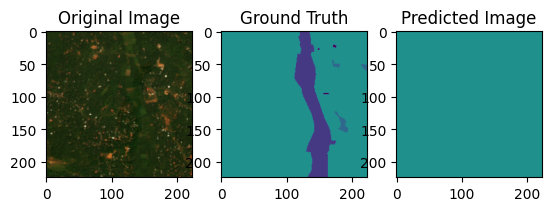

The unique GT class labels are [1 2 3 4]
The unique predicted class labels are [4]
51
1/1 [==============================] - 0s 21ms/step


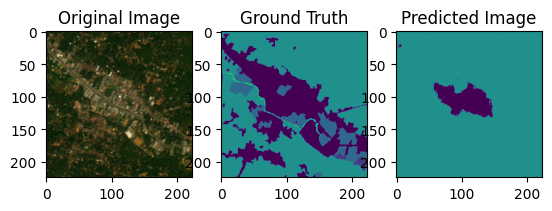

The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [1 2 4]
52
1/1 [==============================] - 0s 22ms/step


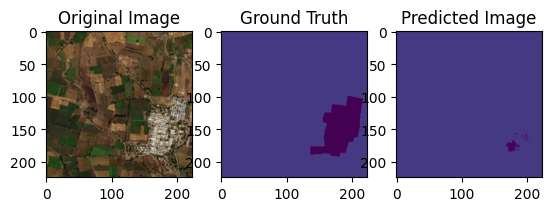

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
53
1/1 [==============================] - 0s 20ms/step


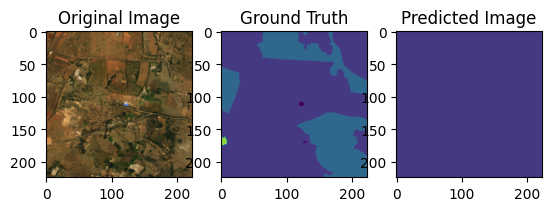

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
54
1/1 [==============================] - 0s 20ms/step


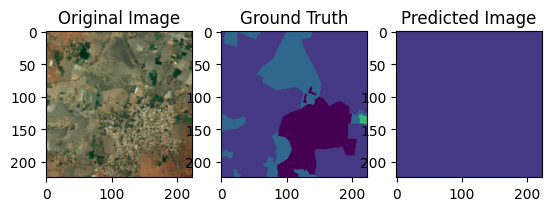

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
55
1/1 [==============================] - 0s 20ms/step


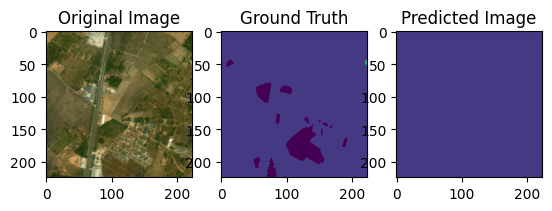

The unique GT class labels are [1 2 5 7]
The unique predicted class labels are [2]
56
1/1 [==============================] - 0s 20ms/step


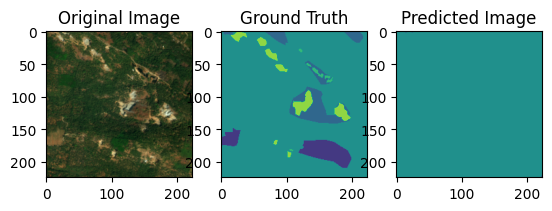

The unique GT class labels are [2 3 4 5 6]
The unique predicted class labels are [2 4]
57
1/1 [==============================] - 0s 22ms/step


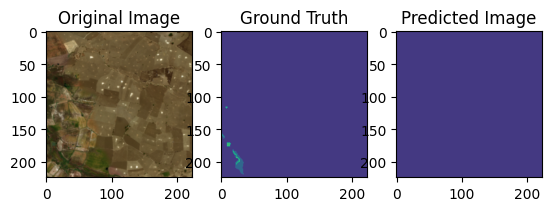

The unique GT class labels are [2 3 5]
The unique predicted class labels are [2]
58
1/1 [==============================] - 0s 23ms/step


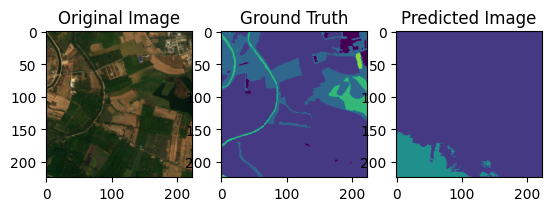

The unique GT class labels are [1 2 3 5 6 7]
The unique predicted class labels are [2 3 4]
59
1/1 [==============================] - 0s 21ms/step


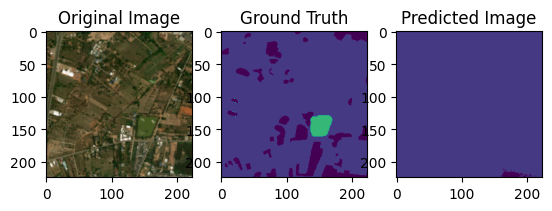

The unique GT class labels are [1 2 5 7]
The unique predicted class labels are [1 2]
60
1/1 [==============================] - 0s 21ms/step


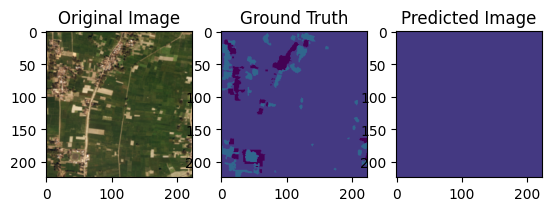

The unique GT class labels are [1 2 3]
The unique predicted class labels are [2]
61
1/1 [==============================] - 0s 26ms/step


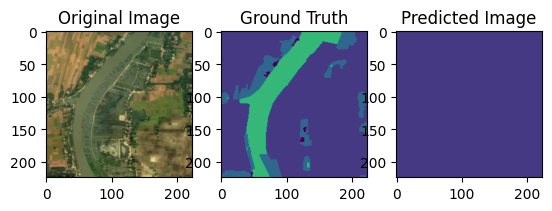

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
62
1/1 [==============================] - 0s 22ms/step


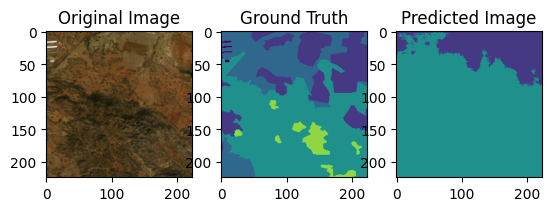

The unique GT class labels are [1 2 3 4 6]
The unique predicted class labels are [2 4]
63
1/1 [==============================] - 0s 21ms/step


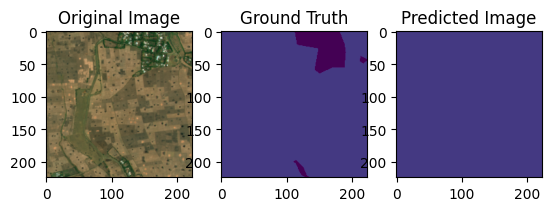

The unique GT class labels are [1 2]
The unique predicted class labels are [2]
64
1/1 [==============================] - 0s 21ms/step


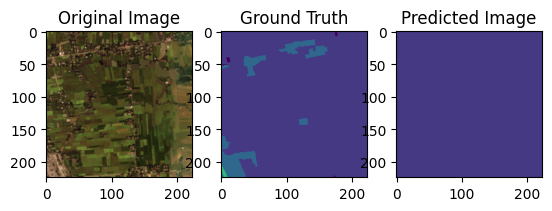

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
65
1/1 [==============================] - 0s 20ms/step


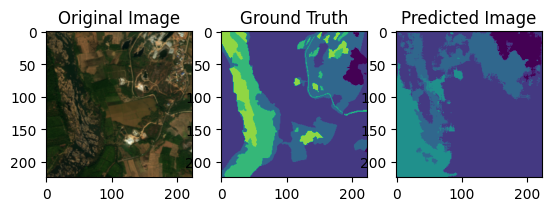

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2 3 4]
66
1/1 [==============================] - 0s 20ms/step


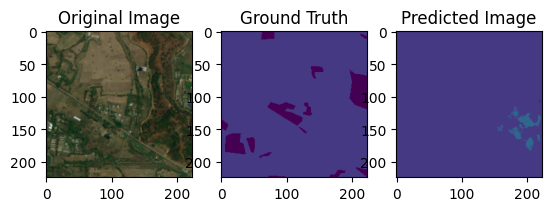

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2 3]
67
1/1 [==============================] - 0s 26ms/step


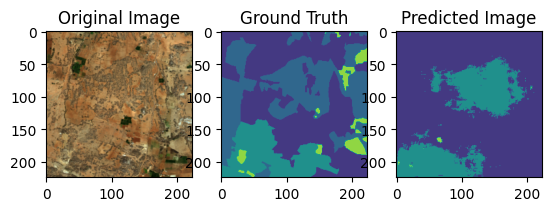

The unique GT class labels are [2 3 4 6]
The unique predicted class labels are [2 4 6]
68
1/1 [==============================] - 0s 22ms/step


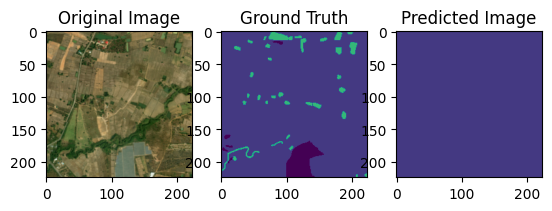

The unique GT class labels are [1 2 5 7]
The unique predicted class labels are [2]
69
1/1 [==============================] - 0s 22ms/step


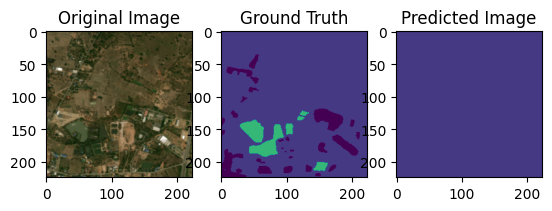

The unique GT class labels are [1 2 5 7]
The unique predicted class labels are [2]
70
1/1 [==============================] - 0s 21ms/step


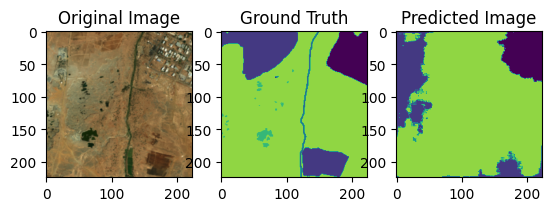

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2 6]
71
1/1 [==============================] - 0s 20ms/step


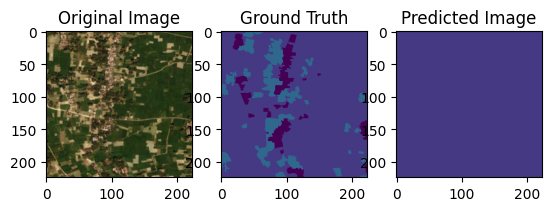

The unique GT class labels are [1 2 3]
The unique predicted class labels are [2]
72
1/1 [==============================] - 0s 21ms/step


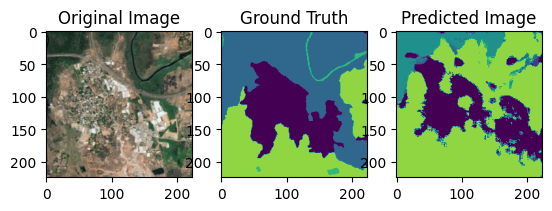

The unique GT class labels are [1 3 5 6 7]
The unique predicted class labels are [1 2 3 4 5 6]
73
1/1 [==============================] - 0s 21ms/step


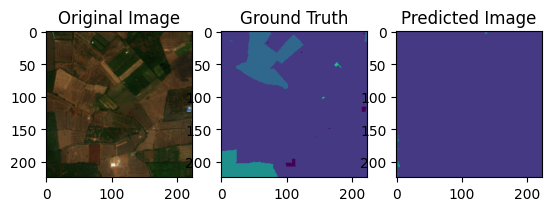

The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [2 4]
74
1/1 [==============================] - 0s 22ms/step


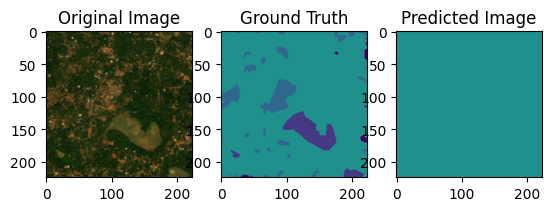

The unique GT class labels are [1 2 3 4]
The unique predicted class labels are [2 4]
75
1/1 [==============================] - 0s 22ms/step


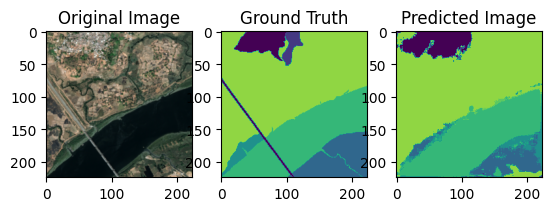

The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [1 2 3 4 5 6]
76
1/1 [==============================] - 0s 21ms/step


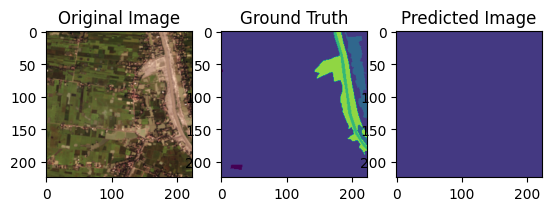

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
77
1/1 [==============================] - 0s 21ms/step


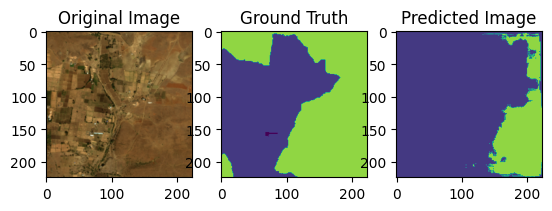

The unique GT class labels are [1 2 6]
The unique predicted class labels are [2 6]
78
1/1 [==============================] - 0s 21ms/step


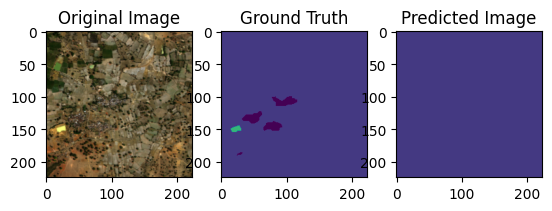

The unique GT class labels are [1 2 5]
The unique predicted class labels are [2]
79
1/1 [==============================] - 0s 21ms/step


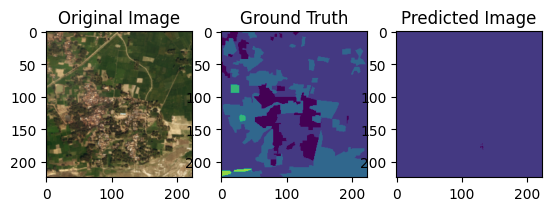

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2]
80
1/1 [==============================] - 0s 24ms/step


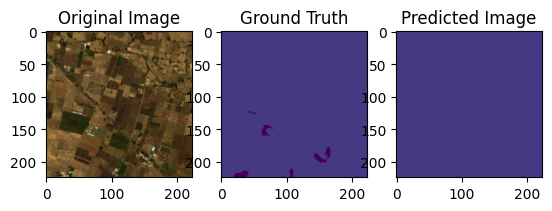

The unique GT class labels are [1 2]
The unique predicted class labels are [2]
81
1/1 [==============================] - 0s 21ms/step


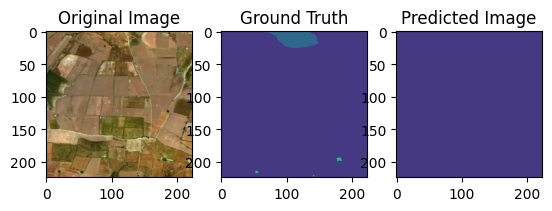

The unique GT class labels are [2 3 5]
The unique predicted class labels are [2]
82
1/1 [==============================] - 0s 21ms/step


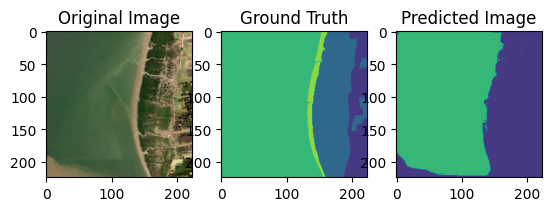

The unique GT class labels are [2 3 5 6]
The unique predicted class labels are [2 3 5]
83
1/1 [==============================] - 0s 21ms/step


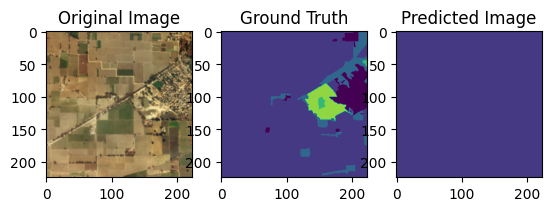

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
84
1/1 [==============================] - 0s 21ms/step


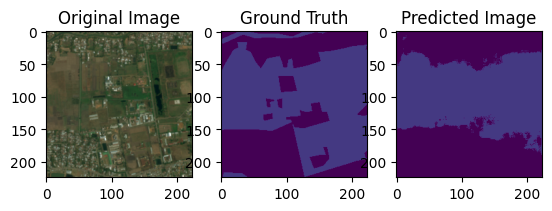

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
85
1/1 [==============================] - 0s 22ms/step


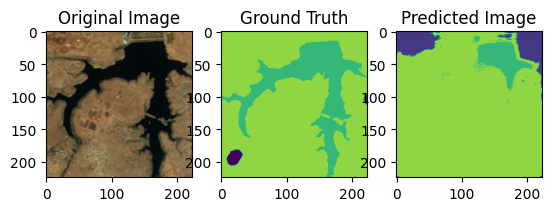

The unique GT class labels are [1 2 5 6]
The unique predicted class labels are [2 5 6]
86
1/1 [==============================] - 0s 22ms/step


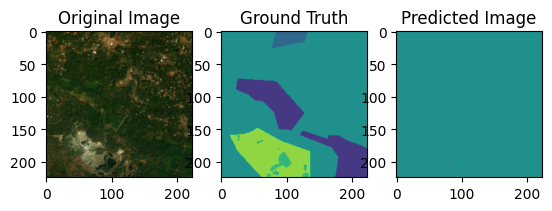

The unique GT class labels are [2 3 4 5 6]
The unique predicted class labels are [1 2 4]
87
1/1 [==============================] - 0s 22ms/step


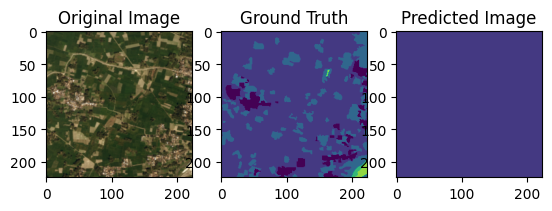

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
88
1/1 [==============================] - 0s 21ms/step


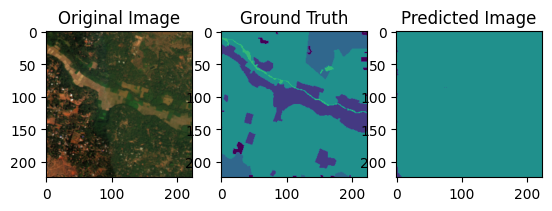

The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [2 3 4]
89
1/1 [==============================] - 0s 20ms/step


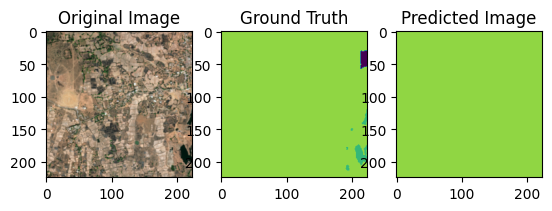

The unique GT class labels are [1 5 6]
The unique predicted class labels are [1 2 6]
90
1/1 [==============================] - 0s 21ms/step


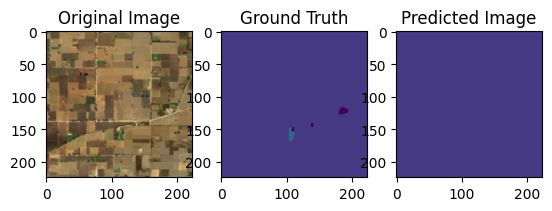

The unique GT class labels are [1 2 3]
The unique predicted class labels are [2]
91
1/1 [==============================] - 0s 21ms/step


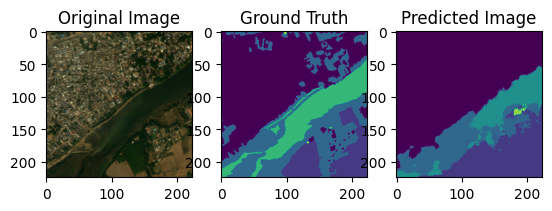

The unique GT class labels are [1 2 3 5 6 7]
The unique predicted class labels are [1 2 3 4 6]
92
1/1 [==============================] - 0s 23ms/step


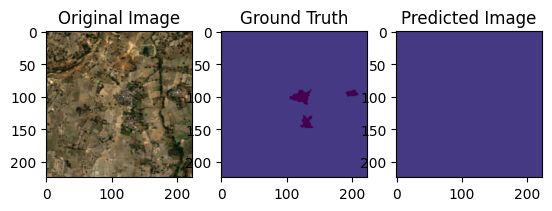

The unique GT class labels are [1 2]
The unique predicted class labels are [2]
93
1/1 [==============================] - 0s 21ms/step


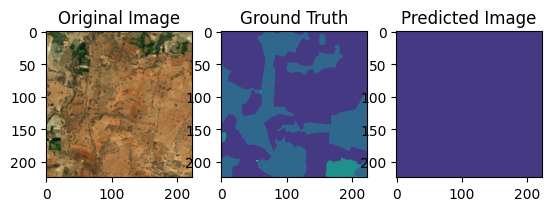

The unique GT class labels are [2 3 4 6]
The unique predicted class labels are [2]
94
1/1 [==============================] - 0s 21ms/step


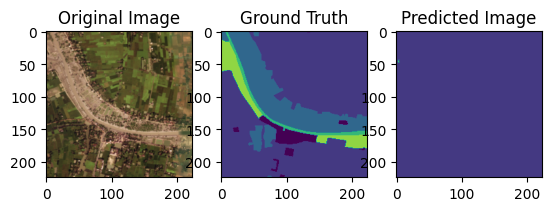

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2 6]
95
1/1 [==============================] - 0s 21ms/step


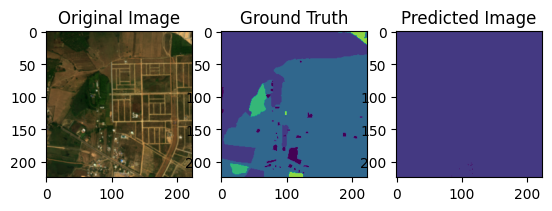

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2]
96
1/1 [==============================] - 0s 21ms/step


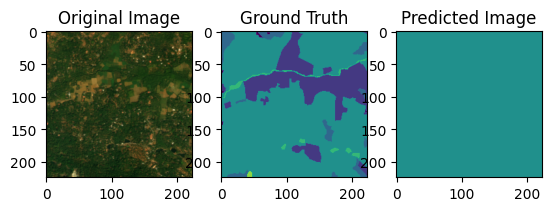

The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [4]
97
1/1 [==============================] - 0s 22ms/step


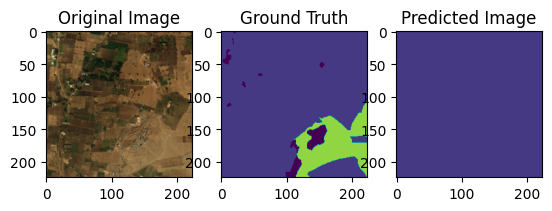

The unique GT class labels are [1 2 6]
The unique predicted class labels are [2]
98
1/1 [==============================] - 0s 22ms/step


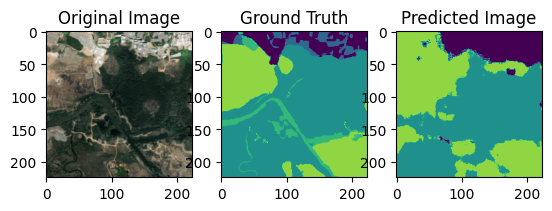

The unique GT class labels are [1 3 4 5 6 7]
The unique predicted class labels are [1 2 4 6]
99
1/1 [==============================] - 0s 21ms/step


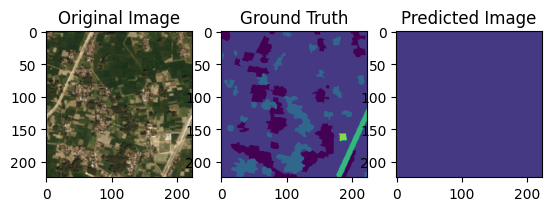

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
100
1/1 [==============================] - 0s 21ms/step


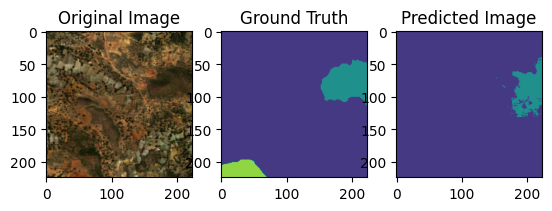

The unique GT class labels are [2 4 6]
The unique predicted class labels are [2 4]
101
1/1 [==============================] - 0s 21ms/step


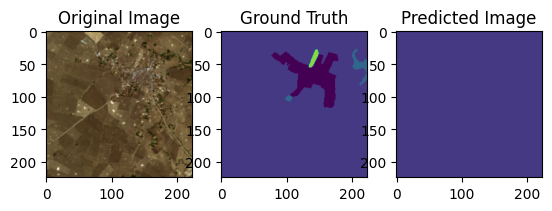

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
102
1/1 [==============================] - 0s 22ms/step


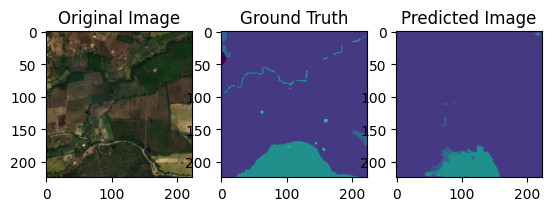

The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [2 3 4]
103
1/1 [==============================] - 0s 21ms/step


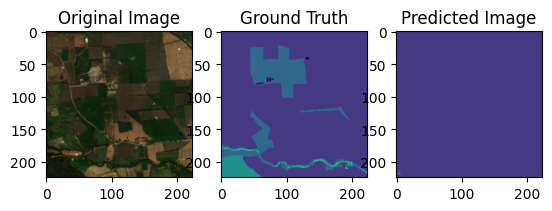

The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [2 4]
104
1/1 [==============================] - 0s 22ms/step


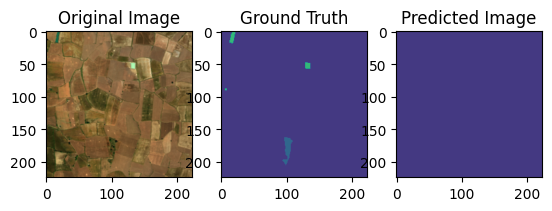

The unique GT class labels are [2 3 5]
The unique predicted class labels are [2]
105
1/1 [==============================] - 0s 25ms/step


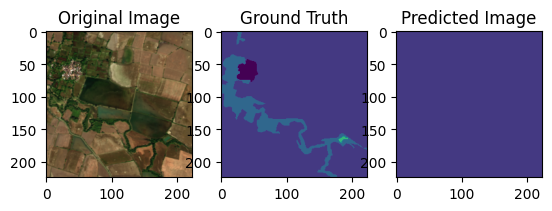

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
106
1/1 [==============================] - 0s 21ms/step


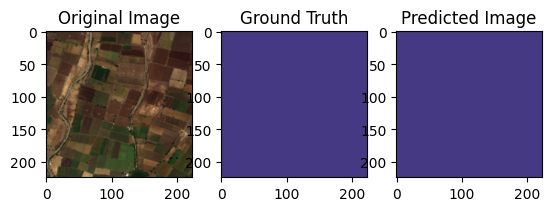

The unique GT class labels are [2]
The unique predicted class labels are [2]
107
1/1 [==============================] - 0s 22ms/step


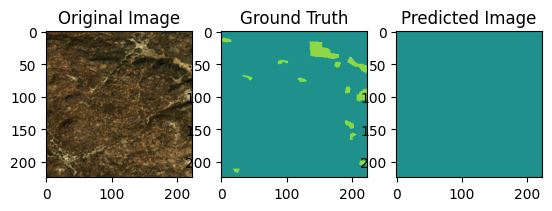

The unique GT class labels are [4 6]
The unique predicted class labels are [2 4]
108
1/1 [==============================] - 0s 20ms/step


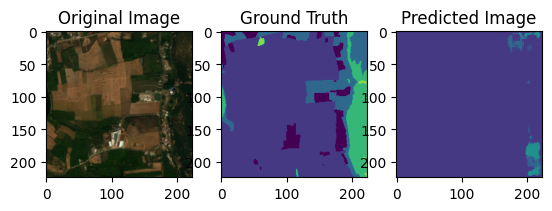

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2 3 4]
109
1/1 [==============================] - 0s 21ms/step


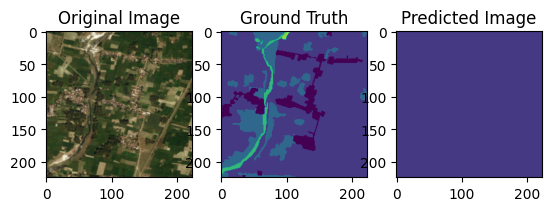

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
110
1/1 [==============================] - 0s 23ms/step


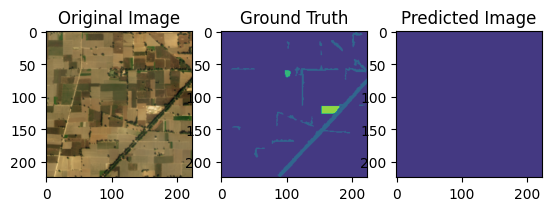

The unique GT class labels are [2 3 5 6]
The unique predicted class labels are [2]
111
1/1 [==============================] - 0s 21ms/step


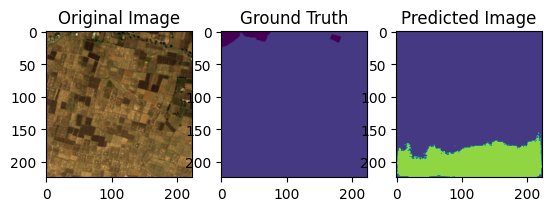

The unique GT class labels are [1 2]
The unique predicted class labels are [2 6]
112
1/1 [==============================] - 0s 21ms/step


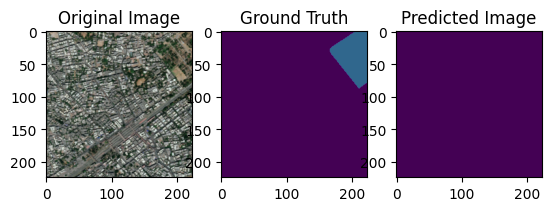

The unique GT class labels are [1 3]
The unique predicted class labels are [1 2]
113
1/1 [==============================] - 0s 22ms/step


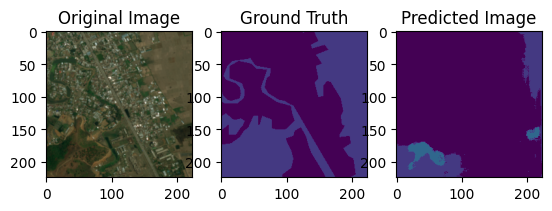

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2 3]
114
1/1 [==============================] - 0s 22ms/step


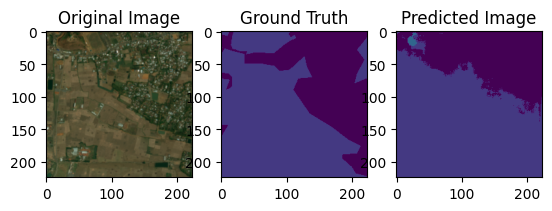

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2 3]
115
1/1 [==============================] - 0s 21ms/step


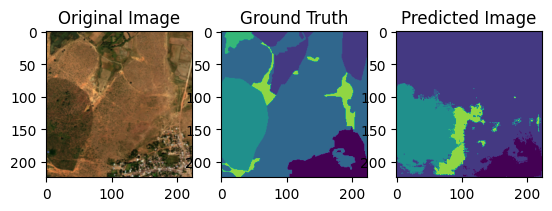

The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [1 2 3 4 6]
116
1/1 [==============================] - 0s 25ms/step


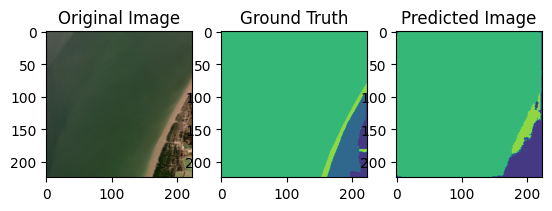

The unique GT class labels are [2 3 5 6 7]
The unique predicted class labels are [2 3 4 5 6]
117
1/1 [==============================] - 0s 21ms/step


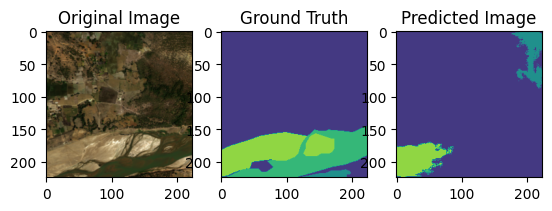

The unique GT class labels are [2 4 5 6]
The unique predicted class labels are [2 4 6]
118
1/1 [==============================] - 0s 21ms/step


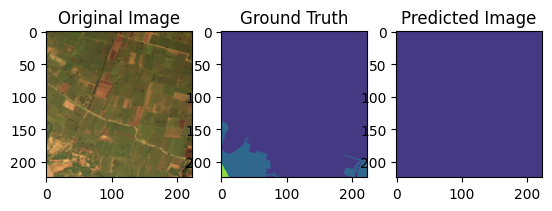

The unique GT class labels are [2 3 6]
The unique predicted class labels are [2]
119
1/1 [==============================] - 0s 20ms/step


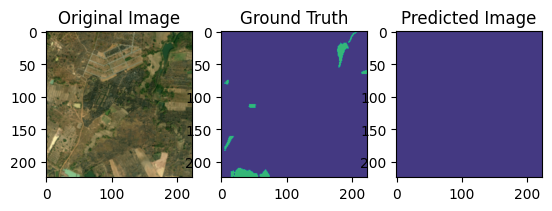

The unique GT class labels are [2 5]
The unique predicted class labels are [2]
120
1/1 [==============================] - 0s 22ms/step


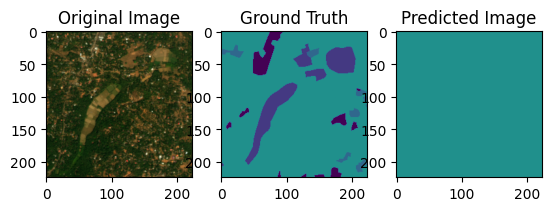

The unique GT class labels are [1 2 3 4]
The unique predicted class labels are [2 4]
121
1/1 [==============================] - 0s 23ms/step


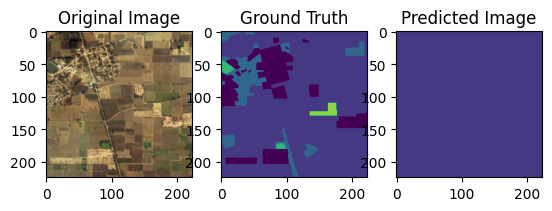

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
122
1/1 [==============================] - 0s 24ms/step


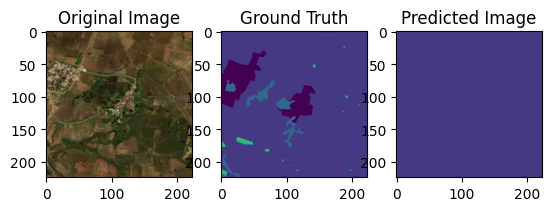

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
123
1/1 [==============================] - 0s 26ms/step


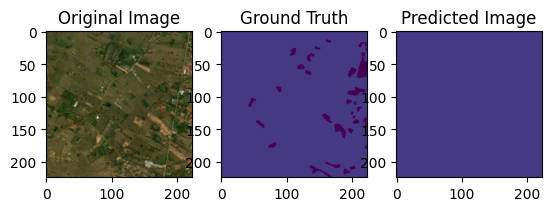

The unique GT class labels are [1 2]
The unique predicted class labels are [2]
124
1/1 [==============================] - 0s 22ms/step


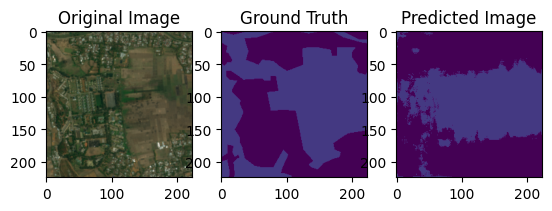

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
125
1/1 [==============================] - 0s 23ms/step


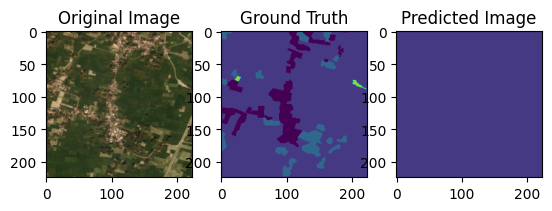

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
126
1/1 [==============================] - 0s 21ms/step


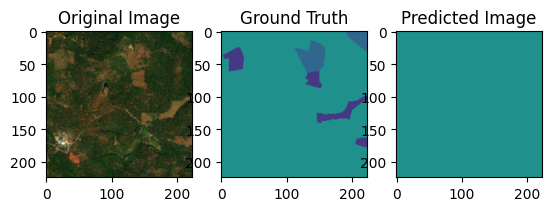

The unique GT class labels are [2 3 4]
The unique predicted class labels are [2 4]
127
1/1 [==============================] - 0s 21ms/step


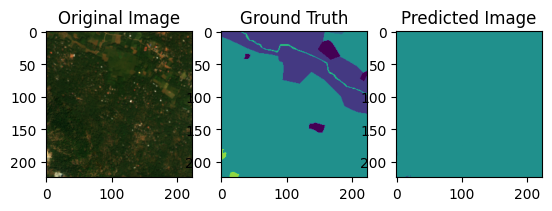

The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [1 2 4]
128
1/1 [==============================] - 0s 20ms/step


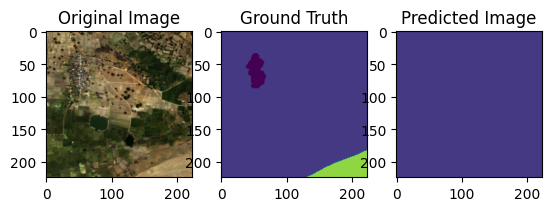

The unique GT class labels are [1 2 6]
The unique predicted class labels are [2]
129
1/1 [==============================] - 0s 22ms/step


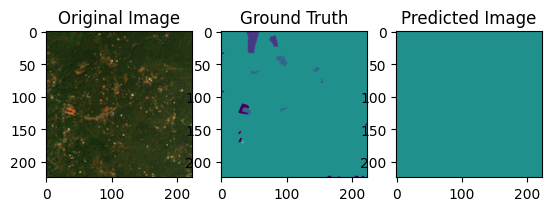

The unique GT class labels are [1 2 3 4 5]
The unique predicted class labels are [4]
130
1/1 [==============================] - 0s 21ms/step


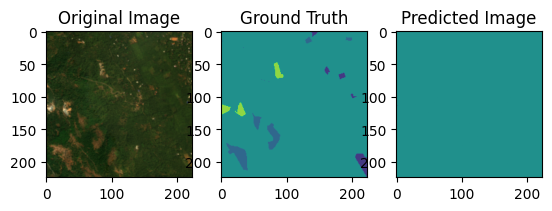

The unique GT class labels are [2 3 4 6]
The unique predicted class labels are [1 4]
131
1/1 [==============================] - 0s 21ms/step


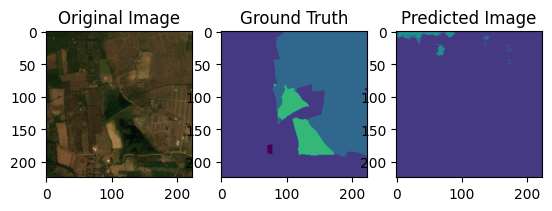

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2 3 4]
132
1/1 [==============================] - 0s 22ms/step


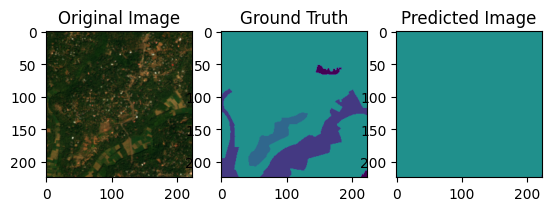

The unique GT class labels are [1 2 3 4]
The unique predicted class labels are [2 4]
133
1/1 [==============================] - 0s 21ms/step


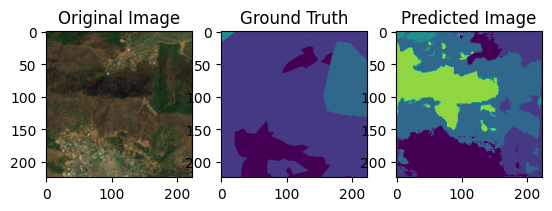

The unique GT class labels are [1 2 3 4]
The unique predicted class labels are [1 2 3 4 6]
134
1/1 [==============================] - 0s 22ms/step


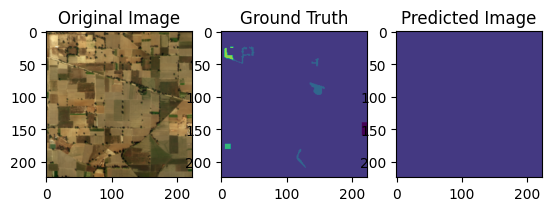

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
135
1/1 [==============================] - 0s 21ms/step


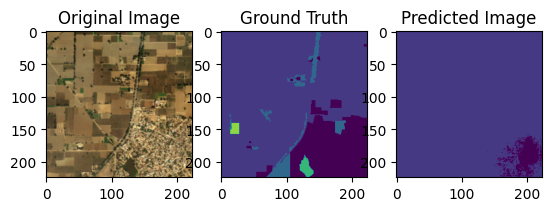

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2]
136
1/1 [==============================] - 0s 21ms/step


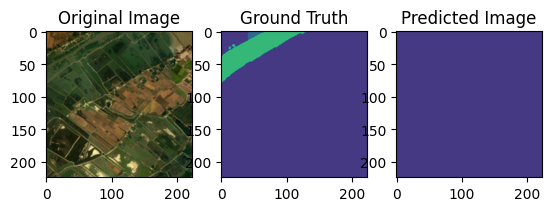

The unique GT class labels are [2 3 5]
The unique predicted class labels are [2]
137
1/1 [==============================] - 0s 21ms/step


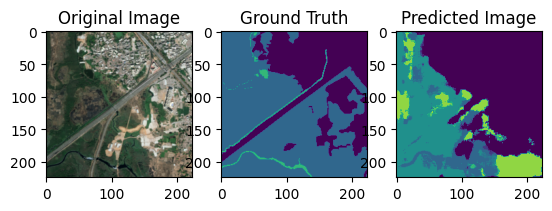

The unique GT class labels are [1 3 5]
The unique predicted class labels are [1 2 3 4 5 6]
138
1/1 [==============================] - 0s 21ms/step


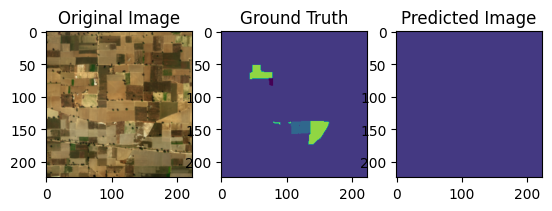

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
139
1/1 [==============================] - 0s 22ms/step


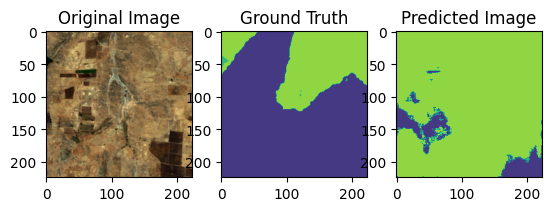

The unique GT class labels are [2 5 6]
The unique predicted class labels are [2 6]
140
1/1 [==============================] - 0s 22ms/step


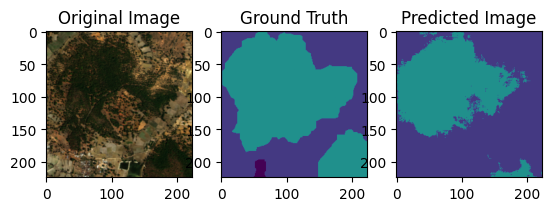

The unique GT class labels are [1 2 4]
The unique predicted class labels are [2 4]
141
1/1 [==============================] - 0s 24ms/step


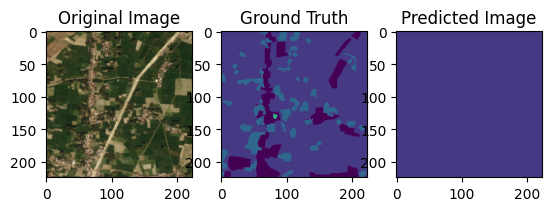

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
142
1/1 [==============================] - 0s 20ms/step


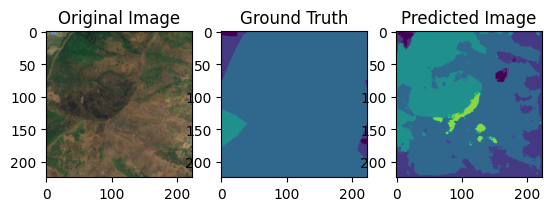

The unique GT class labels are [1 2 3 4]
The unique predicted class labels are [1 2 3 4 6]
143
1/1 [==============================] - 0s 21ms/step


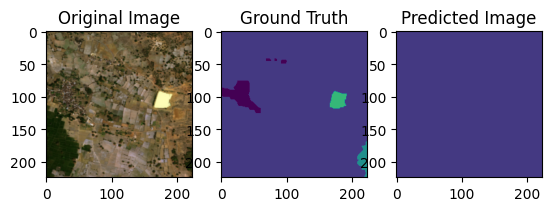

The unique GT class labels are [1 2 4 5]
The unique predicted class labels are [2]
144
1/1 [==============================] - 0s 22ms/step


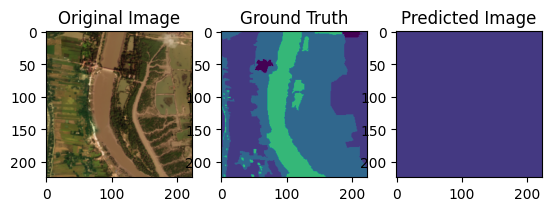

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [2]
145
1/1 [==============================] - 0s 21ms/step


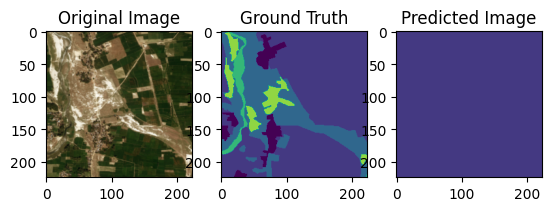

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
146
1/1 [==============================] - 0s 21ms/step


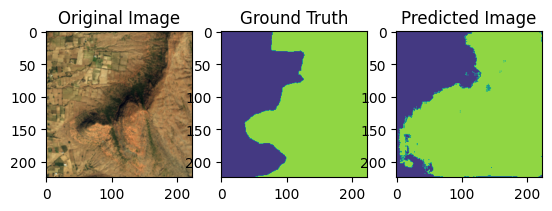

The unique GT class labels are [2 6]
The unique predicted class labels are [2 4 6]
147
1/1 [==============================] - 0s 21ms/step


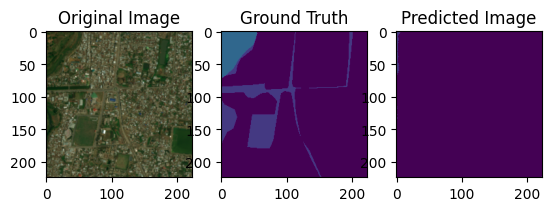

The unique GT class labels are [1 2 3]
The unique predicted class labels are [1 2]
148
1/1 [==============================] - 0s 21ms/step


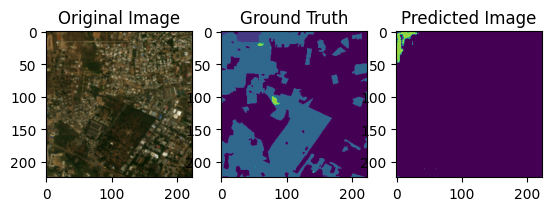

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2 3 6]
149
1/1 [==============================] - 0s 21ms/step


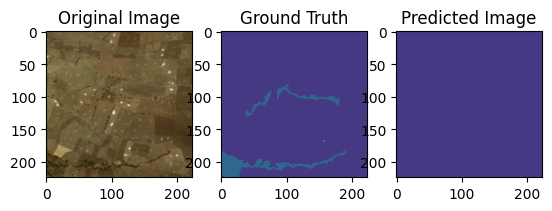

The unique GT class labels are [2 3 5]
The unique predicted class labels are [2]
150
1/1 [==============================] - 0s 22ms/step


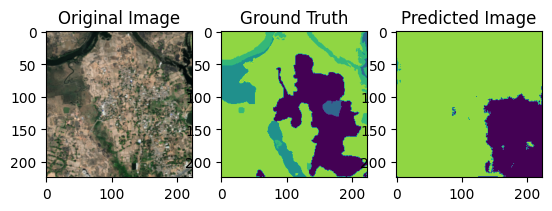

The unique GT class labels are [1 3 4 5 6 7]
The unique predicted class labels are [1 2 4 6]
151
1/1 [==============================] - 0s 22ms/step


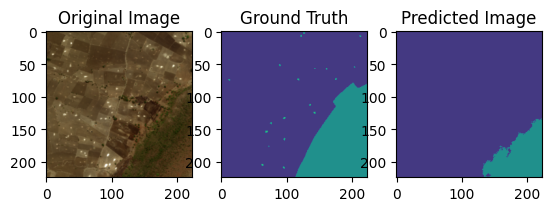

The unique GT class labels are [2 4 5]
The unique predicted class labels are [2 4]
152
1/1 [==============================] - 0s 21ms/step


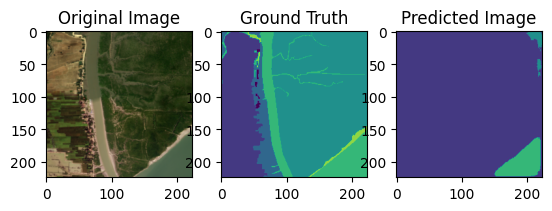

The unique GT class labels are [1 2 3 4 5 6]
The unique predicted class labels are [2 4 5]
153
1/1 [==============================] - 0s 21ms/step


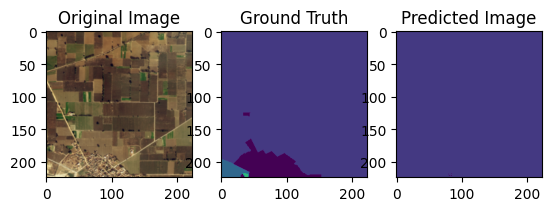

The unique GT class labels are [1 2 3 5]
The unique predicted class labels are [1 2]
154
1/1 [==============================] - 0s 21ms/step


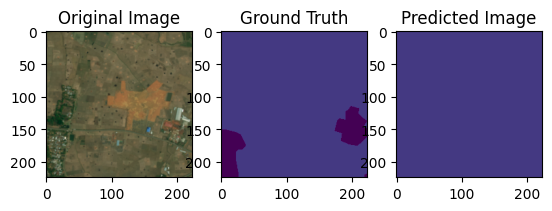

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
155
1/1 [==============================] - 0s 20ms/step


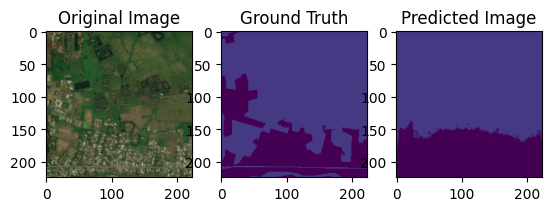

The unique GT class labels are [1 2]
The unique predicted class labels are [1 2]
156
1/1 [==============================] - 0s 21ms/step


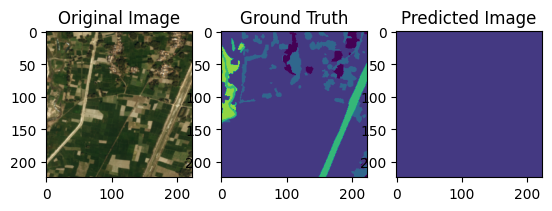

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [2]
157
1/1 [==============================] - 0s 22ms/step


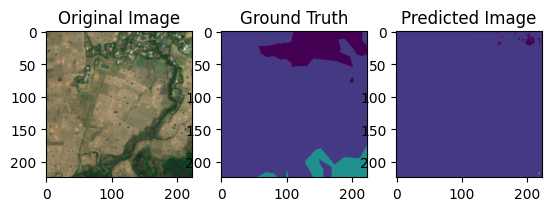

The unique GT class labels are [1 2 4]
The unique predicted class labels are [1 2 4]
158
1/1 [==============================] - 0s 24ms/step


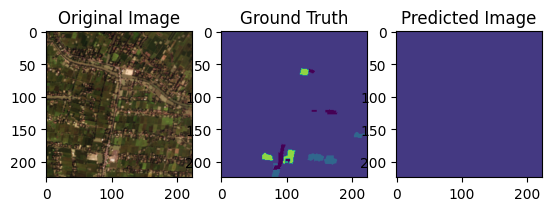

The unique GT class labels are [1 2 3 6]
The unique predicted class labels are [2]
159
1/1 [==============================] - 0s 22ms/step


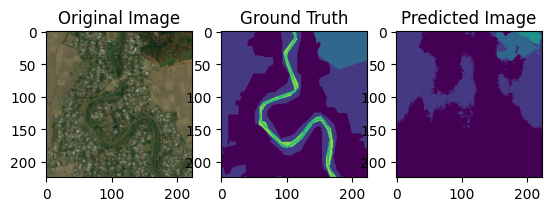

The unique GT class labels are [1 2 3 5 6]
The unique predicted class labels are [1 2 3 4]
160
1/1 [==============================] - 0s 22ms/step


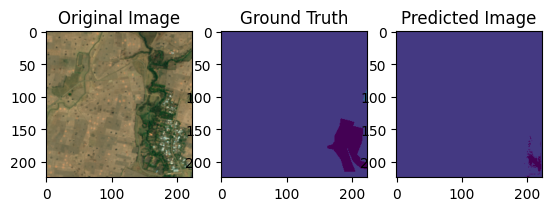

The unique GT class labels are [1 2 3]
The unique predicted class labels are [1 2]


In [ ]:
from tensorflow.keras.preprocessing.image import array_to_img

# Prediction loop
num_samples_to_predict = 50  # change here for the number of images to predict

print(X_val.shape[0])

for i in range(161):
  print(i)
  # Generate a random index for prediction
  random_index = i

  # Select a sample from the validation set
  sample_image = X_val[random_index]
  sample_one_hot_label = y_val[random_index]

  # Expand dimensions to match the model input shape
  sample_image = np.expand_dims(sample_image, axis=0)

  # Make the prediction
  predictions = ensemble_predict(sample_image, unet_model, vgg16_model, resnet50_model)

  # Convert predictions to categorical indices
  predicted_label_indices = np.argmax(predictions, axis=-1) + 1

  # Convert one-hot encoded label to categorical indices
  sample_label_indices = np.argmax(sample_one_hot_label, axis=-1) + 1

  # Display the original image
  plt.subplot(1, 3, 1)
  plt.imshow(array_to_img(sample_image.squeeze()))
  plt.title("Original Image")

  # Display the ground truth (categorical indices, one-indexed)
  plt.subplot(1, 3, 2)
  plt.imshow(sample_label_indices, cmap='viridis', vmin=1, vmax=7)
  plt.title("Ground Truth")

  # Display the predicted image (categorical index, one-indexed)
  plt.subplot(1, 3, 3)
  plt.imshow(predicted_label_indices.squeeze(), cmap='viridis', vmin=1, vmax=7)
  plt.title("Predicted Image")

  plt.show()
  print(f'The unique GT class labels are {np.unique(sample_label_indices)}')
  print(f'The unique predicted class labels are {np.unique(predicted_label_indices.squeeze())}')

In [ ]:
# Create list of land cover categorical labels that correspond to the predicted index labels
labels = ['urban_land', 'agriculture_land', 'rangeland', 'forest_land', 'water', 'barren_land', 'unknown']

6/6 [==============================] - 2s 294ms/step
Training Accuracy: 0.8152
Test Accuracy: 0.7936


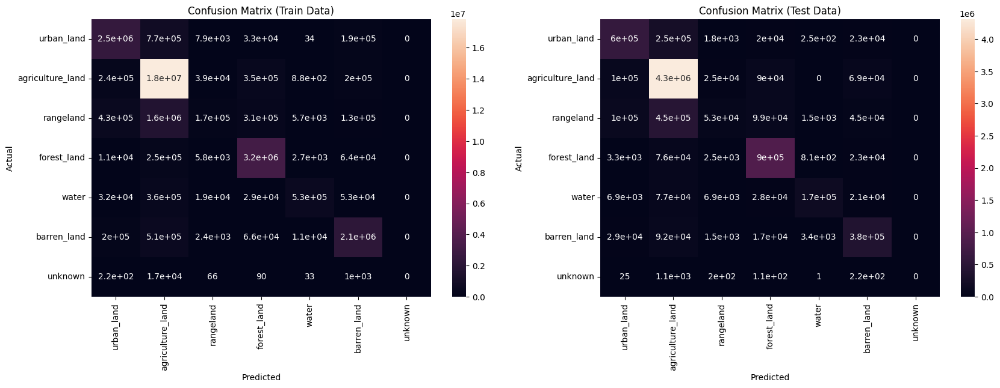

In [ ]:
from sklearn.metrics import accuracy_score

def display_confusion_matrix(x_train, y_train, x_test, y_test, labels):

    actual_y_train = ensemble_predict(x_train, unet_model, vgg16_model, resnet50_model)
    actual_y_test = ensemble_predict(x_test, unet_model, vgg16_model, resnet50_model)

    plt.figure(figsize=(20, 6))

    labels = np.array(labels)

    # Convert the target labels into the categorical index
    y_train_index = y_train.argmax(axis=-1)
    actual_y_train_index = actual_y_train.argmax(axis=-1)
    y_test_index = y_test.argmax(axis=-1)
    actual_y_test_index = actual_y_test.argmax(axis=-1)

    # Convert the matrix to a column array
    y_train_index = y_train_index.reshape(1, -1).flatten()
    actual_y_train_index = actual_y_train_index.reshape(1, -1).flatten()

    y_test_index = y_test_index.reshape(1, -1).flatten()
    actual_y_test_index = actual_y_test_index.reshape(1, -1).flatten()

    # Print the first Confusion Matrix for the training data
    cm = confusion_matrix(y_train_index, actual_y_train_index)
    cm_df = pd.DataFrame(cm, labels, labels)
    plt.subplot(1, 2, 1)
    plt.title('Confusion Matrix (Train Data)')
    sns.heatmap(cm_df, annot=True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')

    # Calculate accuracy for the training data
    train_accuracy = accuracy_score(y_train_index, actual_y_train_index)
    print(f'Training Accuracy: {train_accuracy:.4f}')

    # Print the second Confusion Matrix for the test data
    cm = confusion_matrix(y_test_index, actual_y_test_index)
    cm_df = pd.DataFrame(cm, labels, labels)
    plt.subplot(1, 2, 2)
    plt.title('Confusion Matrix (Test Data)')
    sns.heatmap(cm_df, annot=True)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')

    # Calculate accuracy for the test data
    test_accuracy = accuracy_score(y_test_index, actual_y_test_index)
    print(f'Test Accuracy: {test_accuracy:.4f}')

    plt.show()

# Assuming you have x_train, y_train, x_test, y_test, labels defined
display_confusion_matrix(X_train, y_train, X_val, y_val, labels)


## Findings


The results for the chosen model are following:

| Epoch | Training Loss | Training Accuracy | Validation Loss | Validation Accuracy |
|-------|---------------|-------------------|-----------------|---------------------|
| 92     | 0.8100       | 0.7387            | 0.8057          | 0.7407              |

The class imbalance is shown below:

| class       | pixel count | proportion |
|-------------|-------------|------------|
| Urban       | 642.4M      | 9.35%      |
| Agriculture | 3898.0M     | 56.76%     |
| Rangeland   | 701.1M      | 10.21%     |
| Forest      | 944.4M      | 13.75%     |
| Water       | 256.9M      | 3.74%      |
| Barren      | 421.8M      | 6.14%      |
| Unknown     | 3.0M        | 0.04%      |

The pixel distribution across all class labels is imbalance, so the plain U-net model did not produce the required accuracy. Moreover, in Figure 6 of https://arxiv.org/pdf/1805.06561.pdf, the authors also reported the discrepancy between the results and the ground truth, so the result presented here is fairly expected.

## Further Work and next steps

* Apply transfer learning to get improved accuracy and IoU (~~VGG16~~, EfficientNet and ResNet)
* Explore other light-weight models like MobileNet and EfficientNet
* Code refactoring and create application `app.py` and other library files
* ~~Simple Deployment Case - build Gradio interface for simple user testing (Done)~~
  * Deploy model to Huggingface Space for UAT
* Full Deployment in Docker (build AI server, Flask Server and Web Server containers)

## Ensemble prediction of one satellite image

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import array_to_img
from skimage.transform import resize
from PIL import Image
import io

# Assuming input images are 224x224 with 3 channels
input_shape = (224, 224, 3)

def resize_image(image, input_shape=(224, 224, 3)):
    # Convert to NumPy array and normalize
    image = np.array(image).astype(np.float32) / 255.

    # Resize the image to 224x224
    image_resized = resize(image, input_shape, anti_aliasing=True)

    return image_resized

def ensemble_predict(X_array):
    #
    # Call the predict methods of the unet_model and the vgg16_unet_model
    # to retrieve their predictions.
    #
    # Sum the two predictions together and return their results.
    # You can also consider multiplying a different weight on
    # one or both of the models to improve performance

    X_array = np.expand_dims(X_array, axis=0)

    unet_model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-14 11-20-17/u_net_model.0098-acc-0.75-val_acc-0.74-loss-0.79.h5')
    vgg16_model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-14 05-29-53/u_net_model.0092-acc-0.74-val_acc-0.74-loss-0.82.h5')
    resnet50_model = load_model('/content/drive/MyDrive/ad-hoc_data/archive/train_2024-02-17 07-01-43/u_net_model.0095-acc-0.79-val_acc-0.76-loss-0.72.h5')

    pred_y_unet = unet_model.predict(X_array)
    pred_y_vgg16 = vgg16_model.predict(X_array)
    pred_y_resnet50 = resnet50_model.predict(X_array)

    return (pred_y_unet + pred_y_vgg16 + pred_y_resnet50) / 2

def get_predictions(y_prediction_encoded):

  # Convert predictions to categorical indices
  predicted_label_indices = np.argmax(y_prediction_encoded, axis=-1) + 1

  return predicted_label_indices

def predict(image):
    sample_image_resized = resize_image(image, input_shape)
    y_pred = ensemble_predict(sample_image_resized)
    y_pred = get_predictions(y_pred).squeeze()

    # Create a figure without saving it to a file
    fig, ax = plt.subplots()
    cax = ax.imshow(y_pred, cmap='viridis', vmin=1, vmax=7)

    # Convert the figure to a PIL Image
    image_buffer = io.BytesIO()
    plt.savefig(image_buffer, format='png')
    image_buffer.seek(0)
    image_pil = Image.open(image_buffer)

    # Close the figure to release resources
    plt.close(fig)

    return image_pil

## Gradio Simple Deployment

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

! pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.9/16.9 MB 78.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.1/92.1 kB 15.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.9/307.9 kB 36.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.5/138.5 kB 22.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 115.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.8/77.8 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 kB 12.0 MB/s eta 0:00:00
  Created wheel for ffmpy: filename=ffmpy-0.3.2-py3-none-any.whl

In [ ]:
image_path = '/content/drive/MyDrive/ad-hoc_data/archive/valid/'
sample_images = [image_path+'998699_sat.jpg', image_path+'984098_sat.jpg', image_path+'980625_sat.jpg']

In [ ]:
import gradio as gr

# # Launch Gradio Interface
# gr.Interface(
#     predict,
#     title='Land Cover Segmentation',
#     inputs=[gr.Image()],
#     outputs=[gr.Image()]
# ).launch(debug=True, share=True)


# Launch Gradio Interface
gr.Interface(
    predict,
    title='Land Cover Segmentation',
    inputs=[gr.Image()],
    outputs=[gr.Image()],
    examples=sample_images
).launch(debug=True, share=True)


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/ad-hoc_data/archive/valid/998699_sat.jpg'